In [1]:
from config import torch, np, device, dtype
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
from typing import Tuple, List, Dict, Optional, Union
from torch import Tensor
import time

from pymatgen.analysis.diffraction.xrd import XRDCalculator

import json

from pymatgen.transformations.standard_transformations import RotationTransformation
from pymatgen.io.cif import CifParser

from scipy.optimize import curve_fit

import cmcrameri.cm as cm

from matplotlib import colors, animation
from IPython.display import HTML

import torch.nn as nn
import torch.optim as optim

from torchdiffeq import odeint, odeint_adjoint




In [2]:
!nvidia-smi

Fri Dec 19 14:35:34 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 575.57.08              Driver Version: 575.57.08      CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3090        Off |   00000000:1B:00.0 Off |                  N/A |
|  0%   26C    P8              9W /  350W |    1340MiB /  24576MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

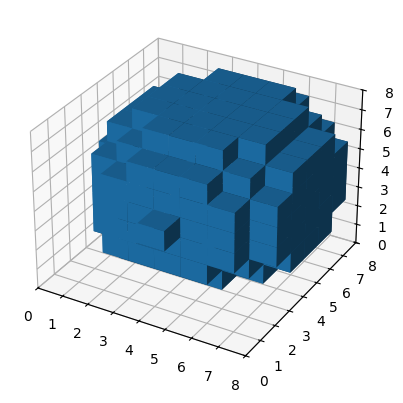

In [9]:
##Mat Plot Lib Voxel Function
mask = scattering_perf.bool_mask(d=(5,5,5), shape_mask = 'circle', r_out = 20).view(5,5,5)
fig = plt.figure()

ax = fig.add_subplot(projection='3d')

step = 1

ax.voxels(mask[::step,::step,::step].cpu(), edgecolor='none')

ax.set_xlim([0, crystal.crystal_size[0] / 5])

ax.set_ylim([0, crystal.crystal_size[1] / 5])

ax.set_zlim([0, crystal.crystal_size[2] / 5]);

 

In [3]:
device

'cuda:3'

In [3]:
from crystal import Crystal
a = 3.25e-10
c = 5.2e-10
 
crystal = Crystal(
    'BaTiO3.cif',
    crystal_size = (32, 32, 32),
    dtype = dtype,
    device = device
)
 
#structure = crystal.parse_cif_file()
rotated_structure = crystal.align_miller_plane_to_axis((1,1,0), target_axis='x')
#crystal.calculate_crystal_properties(rotated_structure)
#crystal.get_atomic_form_factors()
#lengths = crystal.lattice_vectors.norm(dim=1)
#print('Sample size:', ' nm x '.join('{:.1f}'.format(crystal.crystal_size[i] * lengths[i] * 1e9) for i in range(len(lengths))), 'nm')

In [4]:
## R value is coming out suspicoiusly small right now, I think my N might be off
def get_R(crystal, beta, rotated_structure, wavelength, d_xy):
        

    N = crystal.n_cells
        
    lattice_vectors = crystal.lattice_vectors
        
    a1_m, a2_m, a3_m = lattice_vectors.cpu()  # each is a 3-element NumPy array
        # this is in hkl
    

    a_norm = np.linalg.norm(a1_m)


    k = 2*torch.pi / wavelength # can also get this using the k_i/f vals

    R = d_xy * beta * k * (N**(1/3)) * a_norm / torch.pi

    return R

In [5]:
wavelength = 1.5406e-10 #m
theta_B = torch.deg2rad(torch.torch.tensor(31.57126512/2, dtype=dtype, device = device)) 
k_i = torch.tensor([torch.sin(-theta_B), 0.0, torch.cos(-theta_B)], dtype=dtype, device=device)
k_f = torch.tensor([torch.sin(theta_B), 0., torch.cos(theta_B)], dtype=dtype, device=device)

R = get_R(crystal = crystal, beta = 5, rotated_structure = rotated_structure, wavelength = wavelength, d_xy = 50e-6)
print(R)

0.04162203


In [7]:
from coherentscattering_dislocate_Copy1 import CoherentScattering_dislocate
from detector import Detector
'''
scattering = CoherentScattering_dislocate(crystal = crystal,
                                K_i = k_i,
                                K_f = k_f,
                                detector = Detector(
                                    X = 128,
                                    Y = 128,
                                    d_xy = 50e-6,
                                    R = R,
                                    #R = 0.3946,
                                    wavelength = wavelength,
                                    dtype=dtype,
                                    device=device
                                ),
                                dtype=dtype,
                                device=device)
'''


'\nscattering = CoherentScattering_dislocate(crystal = crystal,\n                                K_i = k_i,\n                                K_f = k_f,\n                                detector = Detector(\n                                    X = 128,\n                                    Y = 128,\n                                    d_xy = 50e-6,\n                                    R = R,\n                                    #R = 0.3946,\n                                    wavelength = wavelength,\n                                    dtype=dtype,\n                                    device=device\n                                ),\n                                dtype=dtype,\n                                device=device)\n'

In [8]:
from coherentscattering import CoherentScattering

scattering_perf = CoherentScattering(crystal = crystal,
                                K_i = k_i,
                                K_f = k_f,
                                detector = Detector(
                                    X = 128,
                                    Y = 128,
                                    d_xy = 50e-6,
                                    R = R,
                                    #R = 0.3946,
                                    wavelength = wavelength,
                                    dtype=dtype,
                                    device=device
                                ),
                                dtype=dtype,
                                device=device)
inten_perf = scattering_perf.get_intensity(d=(4,4,4), shape_mask = 'circle', r_out = 20)
inten_perf = inten_perf[None,:,:]

In [9]:
#inten_chill = scattering_perf.get_intensity_chill(d=(5,5,5), shape_mask = 'chill', chill=c)

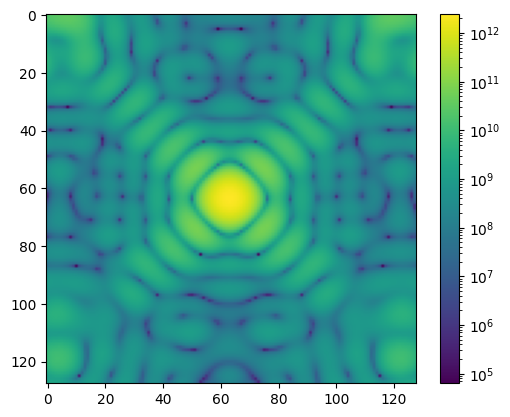

In [10]:
plt.imshow(inten_perf[0,:,:].cpu(), norm=colors.LogNorm())
plt.colorbar()
plt.show()

In [11]:
inten_dis = scattering.get_intensity(d=(4,4,4), scale=1e-10, model = 'Random', lambda_max = 1e+7, poisson = False, index = 1,
                                     shape_mask = 'circle', r_out = 20)

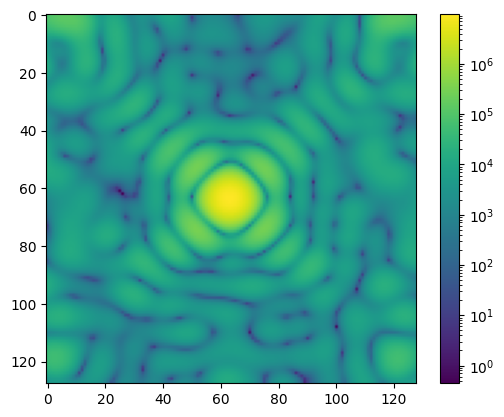

In [12]:
plt.imshow(inten_dis[0,:,:].cpu(), norm=colors.LogNorm())
plt.colorbar()
plt.show()

# PRTF attempt

$$ \text{PRTF(q)} = \int_{}^{}\frac{\langle \Gamma (\vec{q}) \rangle}{|F(\vec{q})|} d\Omega$$

$$|F(\vec{q})|:\text{Measured reciprocal space amplitude}$$

$$\langle \Gamma (\vec{q}) \rangle: \text{Amplitude of FT of obtained reconstruction}$$

In [14]:
# CHECK 
# int over equiv angular values at the same q

In [15]:
# amp_dis = scattering.get_amplitude(d=(10,10,10), scale=5e-10, model = 'Random', lambda_max = 1e+7, poisson = True, index = 1,shape_mask = None, r_out = 20)
# account for differential part

In [16]:
inten_dis = scattering.get_intensity(d=(10,10,10), scale=5e-10, model = 'Random', lambda_max = 1e+7, poisson = True, index = 1,
                                     shape_mask = 'circle', r_out = 20)

In [13]:
class PRTF:
    def __init__(self, real, simulated, n_qstep):
        self.real = real
        self.simulated = simulated
        self.n_qstep = n_qstep

    def prtf(self):

        tot_l = []

        #mask_tot = torch.ones(self.real.shape, dtype = bool)
        
        center_x = self.real.shape[1] / 2 
        center_y = self.real.shape[2] / 2 

        width = self.real.shape[1]/ (np.sqrt(2)*self.n_qstep)

        ny, nx = self.real.shape[1], self.real.shape[2]
        y = torch.arange(ny, device=self.real.device)
        x = torch.arange(nx, device=self.real.device)
        yy, xx = torch.meshgrid(y, x, indexing='ij')
        dist_from_center = torch.sqrt((yy - center_y) ** 2 + (xx - center_x) ** 2)

        i = 0
        j = 0

        r_in = 0
        r_out = r_in + width

        #scale = self.real.mean() / self.simulated.mean()
        #self.simulated = self.simulated * scale

        for n in range(self.n_qstep):
        
            mask_bool = (dist_from_center > r_in) & (dist_from_center <= r_out)
            #mask_bool.unsqueeze(dim=0)

            i += width
            r_in = r_out
            r_out += width

            tot = (self.simulated[:,mask_bool]).mean(dim=(1)) / self.real[:,mask_bool].mean(dim=(1)) # Figure out sum
            tot_l.append(tot)
            
        return torch.stack(tot_l, dim=1)
        
    def animate_mask(self):
        plt.ion()
        fig, ax = plt.subplots()
        imgs = []

        #mask_tot = torch.ones(self.real.shape, dtype = bool)
        
        center_x = self.real.shape[1] / 2 
        center_y = self.real.shape[2] / 2 

        width = self.real.shape[1]/ (np.sqrt(2)*self.n_qstep)

        ny, nx = self.real.shape[1], self.real.shape[2]
        y = torch.arange(ny, device=self.real.device)
        x = torch.arange(nx, device=self.real.device)
        yy, xx = torch.meshgrid(y, x, indexing='ij')
        dist_from_center = torch.sqrt((yy - center_y) ** 2 + (xx - center_x) ** 2)

        i = 0
        j = 0

        r_in = 0
        r_out = r_in + width

        frame = self.simulated[0,:,:].detach().cpu().numpy()
        im = ax.imshow(frame, norm=colors.LogNorm(), animated=True)

        def update(n):
            nonlocal r_in, r_out
            mask = (dist_from_center > r_in) & (dist_from_center <= r_out)

            # reshape mask to 2D and multiply to keep consistent shape
            masked_img = (self.simulated[0,:,:] *mask) / (self.real[0,:,:] *mask) #divided for fun
            
            r_in = r_out
            r_out += width

            im.set_array(masked_img.detach().cpu().numpy())
            return [im]

        ani = FuncAnimation(fig, update, frames=self.n_qstep, interval=200, blit=True)
        return ani

        
        

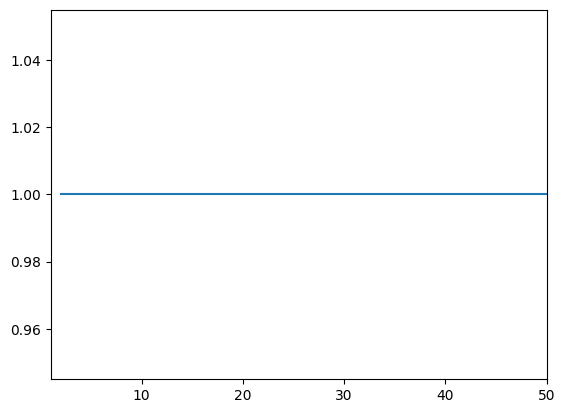

In [16]:
prtf = PRTF(inten_perf,inten_perf,100)
a = prtf.prtf()
b = np.linspace(1,100,100)
plt.plot(b,a[0,:].to('cpu'))
plt.xlim(1, 50)
plt.show()

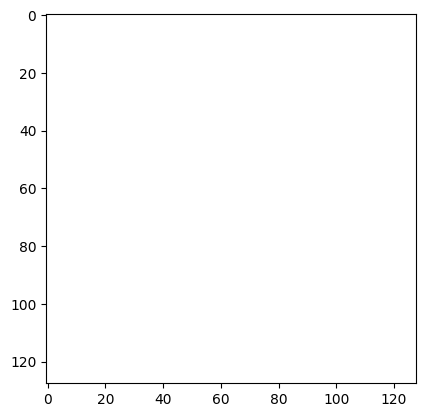

In [68]:
## Animate masks
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
ani = prtf.animate_mask()
from IPython.display import HTML
HTML(ani.to_jshtml())   


# Cahn Hilliard

In [9]:
## Uses Laplacian instead of conv
## Scale down to 32x32x32 and scale L along with it
from cahnhilliard import CahnHilliard

method = 'dopri5'
adjoint = False

args = {'N': 32,      # Grid size (n1xn2xn3 spatial points) --> one crystal
        'L': 0.5,       # Physical domain size (2.0 x 2.0)
        'D': 1e-4,     # Diffusion parameter
        'g': 1e-4      # Length parameter
       }

# Create Cahn-Hilliard model instance and move to specified device
ode = CahnHilliard(args, method, dtype).to(device)

# Simulation parameters
M = 5          # Batch size - number of different initial conditions to simulate orig 10
tf = 50        # Final simulation time, orig 500
warmup = 10     # Number of initial time steps to discard

In [10]:
# Time discretization
T = tf // 10 + warmup + 1     # Total number of time points (including warmup)
t = torch.linspace(0, tf, T)  # Create linearly spaced time vector from 0 to tf
T -= warmup                   # Adjust T to reflect final output size after warmup removal
print('Number of time points:', T)

# Generate random initial conditions for M different trajectories
c0 = ode.init_state(M)

# Solve the ODE system
ts = time.time()
c = ode.solve(t, c0, device=device, rtol=1e-6, atol=1e-6)

# Remove warmup period from results - discard first 'warmup' time steps
c = c[warmup:]
t = t[:-warmup]
print(f'Simulation time (s):', time.time() - ts)

Number of time points: 6
Simulation time (s): 3.515272617340088


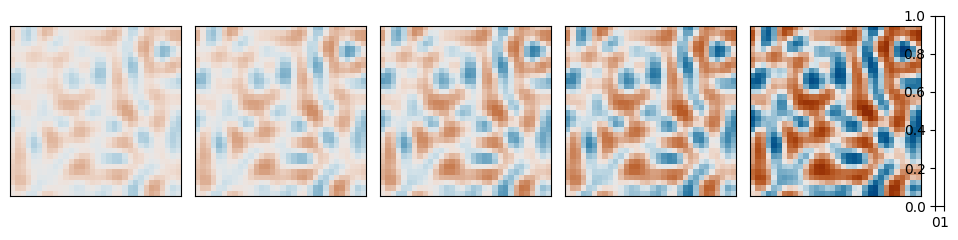

In [11]:
trajectory = 0 # Trajectory index to plot

cmap=cm.vik_r
norm = plt.Normalize(vmin=-1, vmax=1)
sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(1,6, figsize=(10,2.5), gridspec_kw={'width_ratios':[1] * 5 + [0.05]})
fig.tight_layout()
fig.subplots_adjust(hspace=0.1, wspace=0.1)

for i, timestep in enumerate(np.linspace(0, T-1, len(ax) - 1, dtype=int)):
    img = c[timestep, trajectory].view(ode.N, ode.N,ode.N).cpu()
    ax[i].imshow(img[0,:,:], cmap=cmap, norm=norm)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    #format_axis(ax[i], title=f't = {timestep}')
a = c[timestep, trajectory].view(ode.N, ode.N, ode.N)


In [16]:
c.shape

torch.Size([6, 5, 1, 32768])

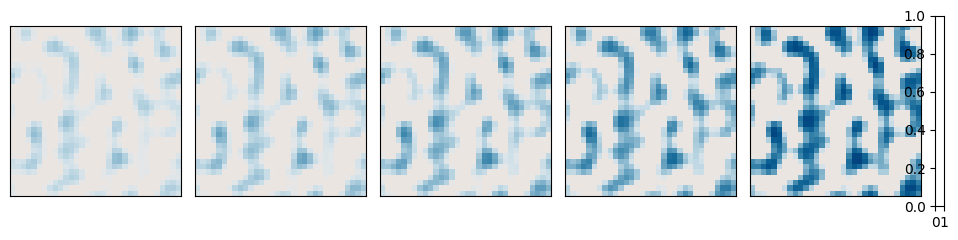

In [12]:
trajectory = 0 # Trajectory index to plot

cmap=cm.vik_r
norm = plt.Normalize(vmin=-1, vmax=1)
sm = matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm)

fig, ax = plt.subplots(1,6, figsize=(10,2.5), gridspec_kw={'width_ratios':[1] * 5 + [0.05]})
fig.tight_layout()
fig.subplots_adjust(hspace=0.1, wspace=0.1)

for i, timestep in enumerate(np.linspace(0, T-1, len(ax) - 1, dtype=int)):
    img = c[timestep, trajectory].view(ode.N, ode.N,ode.N).cpu()
    img2 = torch.relu(img).cpu()
    ax[i].imshow(img2[2,:,:], cmap=cmap, norm=norm)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    #format_axis(ax[i], title=f't = {timestep}')


In [18]:
c.shape

torch.Size([6, 5, 1, 32768])

In [19]:
amp_dis_pos = scattering_perf.get_amplitude_chill(d=(4,4,4),
                                     shape_mask = 'chill', chill = torch.relu(c)) ##relu ->below 0 to 0 above zero remains

amp_dis_neg = scattering_perf.get_amplitude_chill(d=(4,4,4),
                                     shape_mask = 'chill', chill = torch.relu(c)) ##relu ->below 0 to 0 above zero remains

In [20]:
inten_dis = (amp_dis_pos+amp_dis_neg).abs()**2

In [21]:
inten_dis.shape

torch.Size([6, 5, 1, 128, 128])

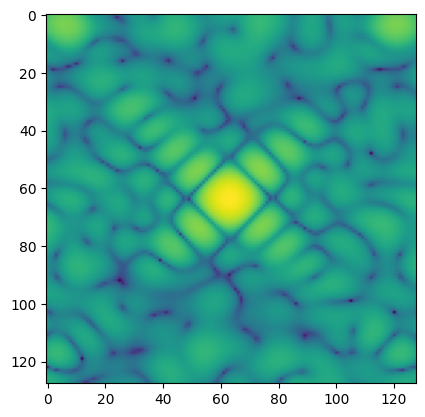

In [22]:
plt.imshow(inten_dis[1,0,0,:,:].cpu(), norm=colors.LogNorm())
plt.show()

Text(0.5, 1.0, 'True Kernel')

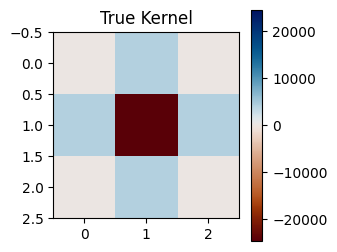

In [23]:
kernel = ode.laplacian.weight.squeeze().cpu()
vmax = kernel.abs().max()
norm = plt.Normalize(vmin=-vmax, vmax=vmax)
fig, ax = plt.subplots(figsize=(3,3))
sm = ax.imshow(kernel[..., kernel.shape[-1] // 2], cmap=cm.vik_r, norm=norm)
plt.colorbar(sm, ax=ax);
plt.title("True Kernel")

In [19]:
print(kernel.sum(), kernel.mean())

tensor(0.) tensor(0.)


In [13]:
from neuralode import NeuralODE
from clipper import AdaptiveGradClipper

args = {'N': ode.N,
        'num_layers': 2
       }

node = NeuralODE(args, method='dopri5', adjoint=False, dtype=dtype).to(device) ## Adjoint True
optimizer = optim.Adam(node.parameters(), lr=5e-4)
clipper =  AdaptiveGradClipper(beta=0.9, scale_factor=2.0)
scheduler = None
#scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma = 0.8)
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=1e-6, max_lr=5e-4, gamma = 0.9, step_size_up = 50)
model_path = 'node_laplacian_chill_32.pth' #change for each ground truth and hyper peram of neural ode
print(node)

NeuralODE(
  (input_conv): Sequential(
    (0): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=same, padding_mode=circular)
    (1): ReLU()
    (2): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=same, padding_mode=circular)
    (3): ReLU()
  )
  (encoders): ModuleList(
    (0): Sequential(
      (0): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=same, padding_mode=circular)
      (2): ReLU()
      (3): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=same, padding_mode=circular)
      (4): ReLU()
    )
    (1): Sequential(
      (0): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=same, padding_mode=circular)
      (2): ReLU()
      (3): Conv3d(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=same, padding_mode=circular)
      

In [14]:
# Set up training parameters
max_iters = 90
batch_time = 3
batch_size = 5

try: saved = torch.load(model_path, weights_only=False, map_location=device)
except:
    chkpt = 10
    loss = []
    c_true = []
    c_preds = []
    intensity_true = []
    intensity_preds = []
    
else:
    chkpt = saved['chkpt']
    loss = saved['loss']
    c_true = saved['c_true']
    c_preds = saved['c_preds']
    intensity_true = saved['intensity_true']
    intensity_preds = saved['intensity_preds']
    
    node.load_state_dict(saved['state'])
    node.to(device)
    optimizer.load_state_dict(saved['optimizer'])
    
    if clipper is not None:
        clipper.load_state_dict(saved['clipper'])
    
    if scheduler is not None:
        scheduler.load_state_dict(saved['scheduler'])

In [15]:
d = (4,4,4)
c.shape

torch.Size([6, 5, 1, 32768])

In [16]:
t_batch, c0_batch, c_batch = node.get_batch(t, c, batch_time, batch_size)

In [28]:
print("c.shape:", c.shape)
print("c_batch.shape:", c_batch.shape)
print("c0_batch.shape:", c0_batch.shape)
print("t_batch.shape:", t_batch.shape)

c.shape: torch.Size([16, 5, 1, 64000])
c_batch.shape: torch.Size([3, 5, 1, 64000])
c0_batch.shape: torch.Size([5, 1, 64000])
t_batch.shape: torch.Size([3])


In [29]:
#node.solve(t_batch, c0_batch, device=device, rtol=1e-6, atol=1e-6) ##This is what is going wrong... (5,n^3) then (5,5,n^3)

In [17]:
# Training loop
end = time.time()
for k in range(1, max_iters + 1):
    # Set neural network to training mode
    node.train()

    # Zero the gradients of the optimizer
    optimizer.zero_grad()

    # Get a random batch of time windows and initial conditions from our full dataset
    t_batch, c0_batch, c_batch = node.get_batch(t, c, batch_time, batch_size)

    # Solve neural ODE from sampled initial conditions
    c_pred = torch.tanh(node.solve(t_batch, c0_batch, device=device, rtol=1e-6, atol=1e-6))

    # Compute intensity
    intensity_batch = scattering_perf.get_intensity_chill(d,
                                     shape_mask = 'chill', chill = torch.sigmoid(c_batch))#.view(batch_time, batch_size, channel, node.N, node.N, node.N)
    intensity_pred = scattering_perf.get_intensity_chill(d,
                                     shape_mask = 'chill', chill = torch.sigmoid(c_pred))#.view(batch_time, batch_size, channel, node.N, node.N,node.N)

    # Add noise
    intensity_batch = torch.poisson(intensity_batch)
            
    # Compute error between predicted and ground truth trajectories
    _loss = nn.L1Loss()(intensity_pred, intensity_batch)

    # Backpropagate gradients
    _loss.backward()
    
    # Update weights
    optimizer.step()
    
    # Checkpoint loss periodically
    if k % chkpt == 0:
        with torch.no_grad():
            node.eval()
            # Get the first trajectory of the dataset
            t_batch, c0_batch, c_batch = t, c[0,[0]], c[:,[0]]##changed, check
        
            # Integrate neural ODE from sampled initial conditions
            c_pred = torch.tanh(node.solve(t_batch, c0_batch, device=device, rtol=1e-6, atol=1e-6))
        
            # Compute intensity
            intensity_batch = scattering_perf.get_intensity_chill(d,
                                     shape_mask = 'chill', chill = torch.sigmoid(c_batch))
            intensity_pred = scattering_perf.get_intensity_chill(d,
                                     shape_mask = 'chill', chill = torch.sigmoid(c_pred))
        
            # Add noise
            intensity_batch = torch.poisson(intensity_batch)

            # Convert to numpy arrays
            c_batch = c_batch.view(-1, node.N, node.N, node.N).cpu().numpy()
            c_pred = c_pred.view(-1, node.N, node.N, node.N).cpu().numpy()
            intensity_batch = intensity_batch.cpu().numpy()
            intensity_pred = intensity_pred.cpu().numpy()

            # Save checkpoint values
            loss.append(_loss.item())
            c_true = c_batch
            c_preds.append(c_pred)
            intensity_true = intensity_batch
            intensity_preds.append(intensity_pred)
            
            print('Iteration: {:04d} | Total Loss: {:.2e} | Time: {:.6f}'.format(k, _loss.item(), time.time() - end))
        
        end = time.time()


OutOfMemoryError: CUDA out of memory. Tried to allocate 10.00 MiB. GPU 3 has a total capacity of 23.56 GiB of which 5.00 MiB is free. Process 2594166 has 254.00 MiB memory in use. Process 2594210 has 254.00 MiB memory in use. Process 2594231 has 254.00 MiB memory in use. Including non-PyTorch memory, this process has 22.79 GiB memory in use. Of the allocated memory 22.43 GiB is allocated by PyTorch, and 51.95 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
fig, ax = plt.subplots(figsize=(12,2))
ax.plot([chkpt * k for k in range(1, len(loss) + 1)], loss, color=cm.lapaz(100))
ax.set_label('Iterations')
ax.set_ylabel('Loss')
#format_axis(ax, xlabel='Iterations', ylabel='Loss')

In [ ]:
torch.save({
    'state': node.state_dict(),
    'optimizer': optimizer.state_dict(),
    'chkpt': chkpt,
    'loss': loss,
    'c_true': c_true,
    'c_preds': c_preds,
    **({'clipper': clipper.state_dict()} if clipper is not None else {}),
    **({'scheduler': scheduler.state_dict()} if scheduler is not None else {}),
    'intensity_true': intensity_true,
    'intensity_preds': intensity_preds
}, model_path)


In [28]:
# Load pretrained model
saved = torch.load('node_laplacian_chill.pth', weights_only=False, map_location=device)
chkpt = saved['chkpt']
loss = saved['loss']

node.load_state_dict(saved['state'])
node.to(device);

In [29]:
with torch.no_grad():
    node.eval()
    # Get the first trajectory of the dataset
    t_batch, c0_batch, c_batch = t, c[0,[0]], c[:,[0]]

    # Solve neural ODE from sampled initial conditions
    c_pred = torch.tanh(node.solve(t_batch, c0_batch, device=device, rtol=1e-6, atol=1e-6))

    # Compute intensity
    intensity_batch = scattering_perf.get_intensity_chill(d,
                                     shape_mask = 'chill', chill = torch.sigmoid(c_batch))
    intensity_pred = scattering_perf.get_intensity_chill(d,
                                     shape_mask = 'chill', chill = torch.sigmoid(c_pred))

    # Convert to numpy arrays
    c_batch = c_batch.view(-1, node.N, node.N, node.N).cpu().numpy()
    c_pred = c_pred.view(-1, node.N, node.N, node.N).cpu().numpy()
    intensity_batch = intensity_batch.cpu().numpy()
    intensity_pred = intensity_pred.cpu().numpy()

In [48]:

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.font_manager as fm
import cmcrameri.cm as cm
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    """
    Create a new colormap from a subset of an existing colormap.
    
    Parameters
    ----------
    cmap : matplotlib.colors.Colormap
        The original colormap to truncate
    minval : float, optional
        Starting point in the original colormap (0.0 to 1.0). Default is 0.0.
    maxval : float, optional
        Ending point in the original colormap (0.0 to 1.0). Default is 1.0.
    n : int, optional
        Number of discrete colors to sample from the specified range. Default is 100.
        
    Returns
    -------
    matplotlib.colors.LinearSegmentedColormap
        New colormap
    
    References
    ----------
    Adapted from: https://gist.github.com/salotz/4f585aac1adb6b14305c
    """
    
    new_cmap = mpl.colors.LinearSegmentedColormap.from_list('trunc({n},{a:.2f},{b:.2f})'.format(
        n=cmap.name, a=minval, b=maxval), cmap(np.linspace(minval, maxval, n)))
    return new_cmap

In [51]:
print(c_batch.shape, c_pred.shape, intensity_batch.shape, intensity_pred.shape)

(6, 40, 40, 40) (6, 40, 40, 40) (6, 1, 1, 128, 128) (6, 1, 1, 128, 128)


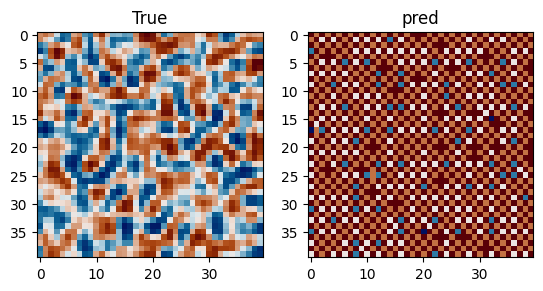

In [34]:
cmap=cm.vik_r
plt.figure()

plt.subplot(1,2,1)
plt.imshow(c_batch[3,0,:], cmap=cmap)
plt.title("True")

plt.subplot(1,2,2)
plt.imshow(c_pred[3,0,:], cmap=cmap)
plt.title("pred")

plt.show()

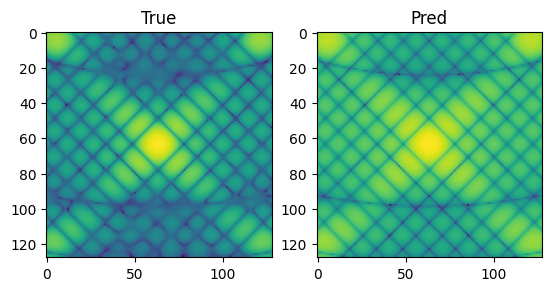

In [31]:
cmap=cm.vik_r
plt.figure()

plt.subplot(1,2,1)
plt.imshow(intensity_batch[3,0,0,:], norm=colors.LogNorm())
plt.title("True")

plt.subplot(1,2,2)
plt.imshow(intensity_pred[3,0,0,:], norm=colors.LogNorm())
plt.title("Pred")

plt.show()

In [49]:
def plot_results(c_true, c_pred, intensity_true, intensity_pred, loss, chkpt, figsize=(12, 6)):

    """
    Create a comprehensive comparison plot showing concentration, intensity, and loss data.
    
    Parameters:
    -----------
    c_true : array-like
        True concentration data
    c_pred : array-like
        Predicted concentration data over training iterations
    intensity_true : array-like
        True intensity data
    intensity_pred : array-like
        Predicted intensity data over training iterations
    loss : array-like
        Loss values over training iterations
    chkpt : int
        Checkpoint interval for loss plotting
    figsize : tuple, optional
        Figure size (width, height) in inches (default: (12, 6))
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The created figure object
    ax : list
        List of all axis objects created
    """
    
    # Create grid layout
    gs = gridspec.GridSpec(3, 5, width_ratios=[1, 2/3, 1, 2/3, 0.05], height_ratios=[1, 1, 4/5])
    fig = plt.figure(figsize=figsize)
    
    # Create axes
    ax = []
    # Top and middle rows (concentration and intensity)
    for row in range(2):
        for col in range(5):
            ax.append(fig.add_subplot(gs[row, col]))
    # Bottom row (loss plot spanning all columns)
    ax.append(fig.add_subplot(gs[2, :]))
    
    # Get spatial dimension
    N = c_true.shape[-1]
    
    # Setup concentration colormap and normalization
    cmap_conc = truncate_colormap(cm.managua, 0.05, 0.95)
    norm_conc = plt.Normalize(vmin=-1, vmax=1)
    sm_conc = mpl.cm.ScalarMappable(cmap=cmap_conc, norm=norm_conc)
    
    # Plot concentration data (top row)
    ax[0].imshow(c_true[..., N//2].T, aspect='auto', cmap=cmap_conc, norm=norm_conc)
    ax[1].imshow(c_true[-1], aspect='equal', cmap=cmap_conc, norm=norm_conc)
    ax[2].imshow(c_pred[..., N//2].T, aspect='auto', cmap=cmap_conc, norm=norm_conc)
    ax[3].imshow(c_pred[-1], aspect='equal', cmap=cmap_conc, norm=norm_conc)
    plt.colorbar(sm_conc, cax=ax[4])
    
    # Format concentration axes
    if format_axis is not None:
        format_axis(ax[0], xlabel='Time', ylabel=r'$y$', title='True')
        format_axis(ax[1], xlabel=r'$x$', ylabel=r'$y$')
        format_axis(ax[2], xlabel='Time', ylabel=r'$y$', title='Pred.')
        format_axis(ax[3], xlabel=r'$x$', ylabel=r'$y$')
        format_axis(ax[4], ylabel='Concentration')
    
    # Remove ticks for cleaner appearance
    ax[0].set_yticks([])
    ax[1].set_xticks([]); ax[1].set_yticks([])
    ax[2].set_yticks([])
    ax[3].set_xticks([]); ax[3].set_yticks([])
    
    # Setup intensity colormap and normalization
    cmap_int = cm.lapaz
    norm_int = mpl.colors.LogNorm(vmin=1e1, vmax=1e4, clip=True)
    sm_int = mpl.cm.ScalarMappable(cmap=cmap_int, norm=norm_int)
    
    # Plot intensity data (middle row)
    ax[5].imshow(intensity_true[..., N//2].T, aspect='auto', cmap=cmap_int, norm=norm_int)
    ax[6].imshow(intensity_true[-1], aspect='equal', cmap=cmap_int, norm=norm_int)
    ax[7].imshow(intensity_pred[..., N//2].T, aspect='auto', cmap=cmap_int, norm=norm_int)
    ax[8].imshow(intensity_pred[-1], aspect='equal', cmap=cmap_int, norm=norm_int)
    plt.colorbar(sm_int, cax=ax[9])
    
    # Format intensity axes
    if format_axis is not None:
        format_axis(ax[5], xlabel='Time', ylabel=r'$q_y$')
        format_axis(ax[6], xlabel=r'$q_x$', ylabel=r'$q_y$')
        format_axis(ax[7], xlabel='Time', ylabel=r'$q_y$')
        format_axis(ax[8], xlabel=r'$q_x$', ylabel=r'$q_y$')
        format_axis(ax[9], ylabel='Intensity')
    
    # Remove ticks for cleaner appearance
    ax[5].set_yticks([])
    ax[6].set_xticks([]); ax[6].set_yticks([])
    ax[7].set_yticks([])
    ax[8].set_xticks([]); ax[8].set_yticks([])
    
    # Plot loss curve (bottom row)
    ax[10].plot([chkpt * k for k in range(1, len(loss) + 1)], loss, color=cm.lapaz(100))
    ax[10].set_xlim([-1, chkpt * (len(loss) + 1) + 1])
    ax[10].set_ylim([0, 100])
    
    if format_axis is not None:
        format_axis(ax[10], xlabel='Iteration', ylabel='Loss')
    
    # Adjust layout
    fig.tight_layout()
    fig.subplots_adjust(hspace=0.4, wspace=0.2)
    
    return fig, ax


TypeError: Invalid shape (40, 40, 6) for image data

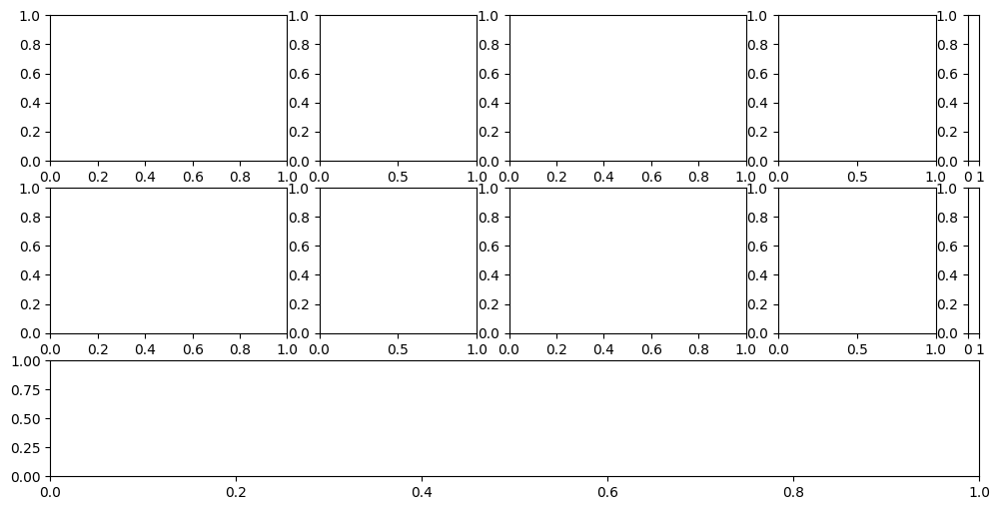

In [50]:
fig, axes = plot_results(c_batch, c_pred, intensity_batch, intensity_pred, loss, chkpt)

# Kuramoto

In [14]:
from kuramoto import Kuramoto

method = 'dopri5'
adjoint = False

args = {'N': 40,
        'K': 4.,
        's': 1.5
       }
M = 10 # Number of initial conditions -- > try to alter to help convergence
# If M gets too large it might not have the memory to run, so have to batch

kuramoto = Kuramoto(args, method, dtype).to(device)
y0 = kuramoto.init_state(M)

t0 = 10
tf = 50 + t0//2
T = 2*tf + 1

t = torch.linspace(0, tf, T)
T -= t0
print('Number of time steps:', T)

batch_size = 2
y = torch.zeros(( T + t0, *y0.shape))
for i in range (0, M, batch_size):
    ts = time.time()
    end_idx = min(i + batch_size, M) #handle last batch that might be smaller
    y[:, i:end_idx] = kuramoto.solve(t, y0[i:end_idx], device=device, rtol=1e-6, atol=1e-6)
    print(f'Batch {i//batch_size +1} of {(M + batch_size - 1)//batch_size}: Time (s): ', time.time() -
          ts)
y = y[t0:] # Exclude initial transients from time series


Number of time steps: 101
Batch 1 of 5: Time (s):  18.223077535629272
Batch 2 of 5: Time (s):  17.88107681274414
Batch 3 of 5: Time (s):  17.71096968650818
Batch 4 of 5: Time (s):  18.01071262359619
Batch 5 of 5: Time (s):  18.022668838500977


In [15]:
y.shape

torch.Size([101, 10, 1, 64000])

Text(0.5, 1.0, 'True Kernel')

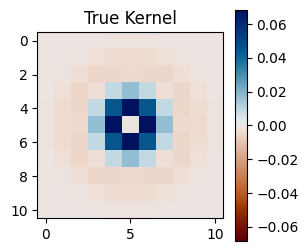

In [16]:
kernel = kuramoto.conv.weight.squeeze().cpu()
vmax = kernel.abs().max()
norm = plt.Normalize(vmin=-vmax, vmax=vmax)
fig, ax = plt.subplots(figsize=(3,3))
sm = ax.imshow(kernel[..., kernel.shape[-1] // 2], cmap=cm.vik_r, norm=norm)
plt.colorbar(sm, ax=ax);
plt.title("True Kernel")



In [17]:
print(kernel.sum(), kernel.mean())

tensor(-0.0849) tensor(-6.3796e-05)


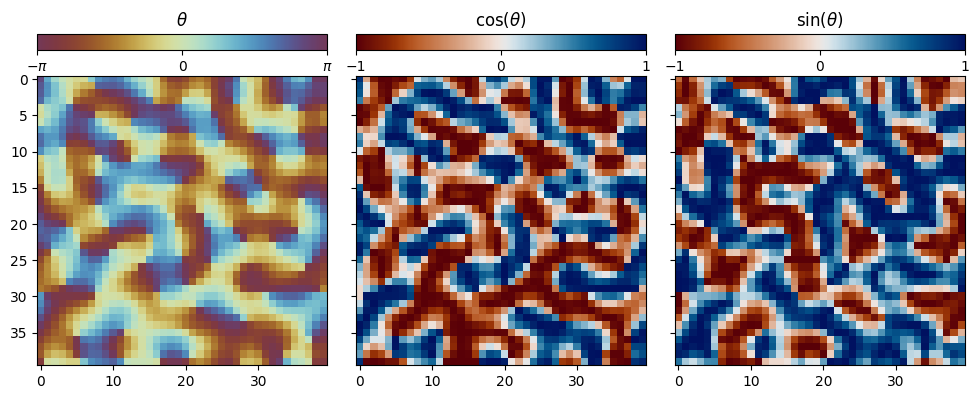

In [18]:
y_reshaped = y.reshape(-1, M, kuramoto.N, kuramoto.N, kuramoto.N).cpu()

i = -1
j = 0
fig, ax = plt.subplots(2,3, figsize=(10,4), gridspec_kw={'height_ratios': [0.05,1]}, sharey='row')
fig.tight_layout()
fig.subplots_adjust(hspace=0.1, wspace=0.1)

sm = ax[1,0].imshow(y_reshaped[i,j,...,0] % (2 * torch.pi) - torch.pi, cmap=cm.romaO, vmin=-np.pi, vmax=np.pi)
cbar = plt.colorbar(sm, cax=ax[0,0], orientation='horizontal', ticks=[-np.pi, 0, np.pi])
ax[0,0].set_xticklabels([r'$-\pi$', '0', r'$\pi$'])
ax[0,0].set_title(r'$\theta$')

sm = ax[1,1].imshow(torch.cos(y_reshaped[i,j,...,0]), cmap=cm.vik_r, vmin=-1, vmax=1)
cbar = plt.colorbar(sm, cax=ax[0,1], orientation='horizontal', ticks=[-1, 0, 1])
ax[0,1].set_title(r'$\cos(\theta)$')

sm = ax[1,2].imshow(torch.sin(y_reshaped[i,j,...,0]), cmap=cm.vik_r, vmin=-1, vmax=1)
cbar = plt.colorbar(sm, cax=ax[0,2], orientation='horizontal', ticks=[-1, 0, 1])
ax[0,2].set_title(r'$\sin(\theta)$');

## Training

In [31]:
from neuralode import NeuralODE
from clipper import AdaptiveGradClipper

args = {'N': kuramoto.N,
        'kernel_size': 11
       }

node = NeuralODE(args, method='dopri5', adjoint=False, dtype=dtype).to(device)
optimizer = optim.Adam(node.parameters(), lr=8e-6)
clipper =  AdaptiveGradClipper(beta=0.9, scale_factor=2.0)
scheduler = None
#scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma = 0.8)
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=1e-6, max_lr=5e-4, gamma = 0.9, step_size_up = 50)
model_path = 'node_gauss_ka11_kg11_diff_L1_er+7_M10_K4_clip_newcircle_smallscale.pth' #change for each ground truth and hyper peram of neural ode
print(node)

NeuralODE(
  (conv): Conv3d(1, 1, kernel_size=(11, 11, 11), stride=(1, 1, 1), padding=same, bias=False, padding_mode=circular)
)


In [32]:

# Set up training parameters
max_iters = 1000
batch_time = 10
batch_size = 1

try: saved = torch.load(model_path, weights_only=True)
except:
    chkpt = 10
    loss = []
    weights = []

else:
    chkpt = saved['chkpt']
    loss = saved['loss']
    weights = saved['weights']
    
    node.load_state_dict(saved['state'])
    node.to(device)
    optimizer.load_state_dict(saved['optimizer'])
    if clipper is not None:
        clipper.load_state_dict(saved['clipper'])
    if scheduler is not None:
        scheduler.load_state_dict(saved['scheduler'])
    #scheduler.load_state_dict(saved['scheduler'])

In [33]:
d = (5,5,5)
scale = .05 * crystal.lattice_vectors.norm()

'''
args = {'A': 1,
        'B': 1,
        'J': 1,
        #'K':-0.75
        'K':-0.1
       }
'''

tf = 50
dt=0.5

lambda_max = 1e+7




In [34]:
'''

#polycrystal.grains

def grain_loop(poly_list, model, lambda_max, d):
    total_amp = 0
    d = d
    for grain in poly_list:
        scattering = CoherentScattering_dislocate_nomask(
            crystal=grain,
            K_i=k_i,
            K_f=k_f,
            detector=Detector(
                X=128,
                Y=128,
                d_xy=50e-6,
                R=R,
                wavelength=wavelength,
                dtype=dtype,
                device=device
            ),
            dtype=dtype,
            device=device
        )
        #r_out = np.random.randint(10,65)

        #size = sizes[polycrystal.grains.index(grain)]
        #size_l = []
    
        
        amp = scattering.get_amplitude(d=d, scale=5e-10, model = model, lambda_max = lambda_max, index = 1)  # amplitude

        total_amp += amp

    inten_total = (total_amp.abs() ** 2)

    return (inten_total)
'''

'\n\n#polycrystal.grains\n\ndef grain_loop(poly_list, model, lambda_max, d):\n    total_amp = 0\n    d = d\n    for grain in poly_list:\n        scattering = CoherentScattering_dislocate_nomask(\n            crystal=grain,\n            K_i=k_i,\n            K_f=k_f,\n            detector=Detector(\n                X=128,\n                Y=128,\n                d_xy=50e-6,\n                R=R,\n                wavelength=wavelength,\n                dtype=dtype,\n                device=device\n            ),\n            dtype=dtype,\n            device=device\n        )\n        #r_out = np.random.randint(10,65)\n\n        #size = sizes[polycrystal.grains.index(grain)]\n        #size_l = []\n\n\n        amp = scattering.get_amplitude(d=d, scale=5e-10, model = model, lambda_max = lambda_max, index = 1)  # amplitude\n\n        total_amp += amp\n\n    inten_total = (total_amp.abs() ** 2)\n\n    return (inten_total)\n'

In [35]:
# Basic training loop when comparing predicted and true states in real 
# L1 loss
end = time.time()


for k in range(1, max_iters + 1):
    # Set out neural network to training mode
    node.train()

    # Zero the gradients of the optimizer
    optimizer.zero_grad()

    # Get a random batch of time windows and initial conditions from our full dataset
    t_batch, y0_batch, y_batch = node.get_batch(t, y0, y, batch_time, batch_size)

    # Integrate neural ODE from sampled initial conditions
    y_pred = node.solve(t_batch, y0_batch, device=device, rtol=1e-6, atol=1e-6)


    # Implement X-ray diffraction
    y_batch_shaped = y_batch.view(-1, batch_size, kuramoto.N, kuramoto.N, kuramoto.N)
    y_pred_shaped = y_pred.view(-1, batch_size, kuramoto.N, kuramoto.N, kuramoto.N)

    displacement_batch = torch.stack([torch.cos(y_batch_shaped), torch.sin(y_batch_shaped), torch.zeros_like(y_batch_shaped)], dim=-1)
    displacement_pred = torch.stack([torch.cos(y_pred_shaped), torch.sin(y_pred_shaped), torch.zeros_like(y_pred_shaped)], dim=-1)
    
    I0_pred = scattering.get_intensity(d=d, scale=1e-10, model = displacement_pred, lambda_max = lambda_max, index = 1, shape_mask = 'circle', r_out = 20)
    I0_pred_diff = I0_pred - inten_perf


    I0_batch = scattering.get_intensity(d=d, scale=1e-10, model = displacement_batch, lambda_max = lambda_max, index = 1, poisson = True,  shape_mask = 'circle', r_out = 20)
    I0_batch_diff = I0_batch - inten_perf
    
    '''
    I0_pred = grain_loop(polycrystal.grains, displacement_pred, lambda_max, d)
    I0_batch = grain_loop(polycrystal.grains, displacement_batch, lambda_max, d)
    '''
    # Compute MSE between predicted and ground truth trajectories 
    _loss = nn.L1Loss()(I0_pred, I0_batch)

    # Backpropagate gradients
    _loss.backward()

    # Clip gradients
    if clipper is not None:
        clipper.clip_gradients(node.parameters())

    # Update weights
    optimizer.step()
    #scheduler.step()

    # Checkpoint loss periodically
    if k % chkpt == 0:
        with torch.no_grad():
            loss.append(_loss.item())
            print('Iteration: {:04d} | Total Loss: {:.2e} | Time: {:.6f}'.format(k, _loss.item(), time.time() - end))
            weights.append(node.conv.weight.detach().cpu())
        
        end = time.time()


Iteration: 0010 | Total Loss: 1.26e+02 | Time: 22.894079
Iteration: 0020 | Total Loss: 1.26e+02 | Time: 23.266566
Iteration: 0030 | Total Loss: 1.64e+02 | Time: 23.668284
Iteration: 0040 | Total Loss: 1.28e+02 | Time: 23.186972
Iteration: 0050 | Total Loss: 1.30e+02 | Time: 23.634665
Iteration: 0060 | Total Loss: 1.39e+02 | Time: 23.294838
Iteration: 0070 | Total Loss: 1.34e+02 | Time: 23.129745
Iteration: 0080 | Total Loss: 1.31e+02 | Time: 23.828422
Iteration: 0090 | Total Loss: 1.29e+02 | Time: 23.631987
Iteration: 0100 | Total Loss: 1.27e+02 | Time: 23.481976
Iteration: 0110 | Total Loss: 1.26e+02 | Time: 23.644121
Iteration: 0120 | Total Loss: 1.30e+02 | Time: 23.653009
Iteration: 0130 | Total Loss: 1.37e+02 | Time: 23.802540
Iteration: 0140 | Total Loss: 1.31e+02 | Time: 23.798223
Iteration: 0150 | Total Loss: 1.29e+02 | Time: 23.622612
Iteration: 0160 | Total Loss: 1.27e+02 | Time: 23.623598
Iteration: 0170 | Total Loss: 1.34e+02 | Time: 22.965299
Iteration: 0180 | Total Loss: 1

Text(0, 0.5, 'Loss')

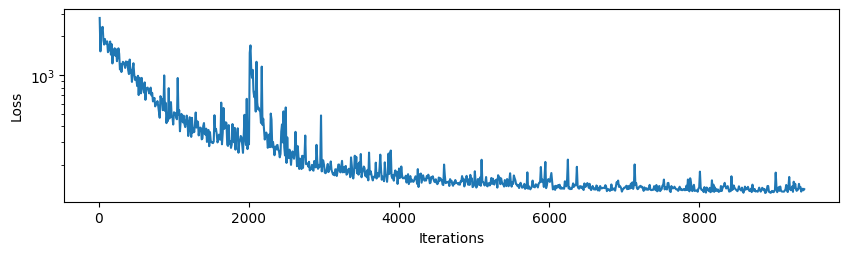

In [37]:
# Plot the loss as a function of training iterations
fig, ax = plt.subplots(figsize=(10,2.5))
ax.plot([chkpt * k for k in range(1, len(loss) + 1)], loss)
ax.set_yscale('log')
ax.set_xlabel('Iterations')
ax.set_ylabel('Loss')

In [38]:
scheduler = None
torch.save({
    #'scheduler': scheduler.state_dict(), 
    'state': node.state_dict(), #make list to append to
    **({'clipper': clipper.state_dict()} if clipper is not None else {}),
    **({'scheduler': scheduler.state_dict()} if scheduler is not None else {}),
    'weights': weights,
    'optimizer': optimizer.state_dict(),
    'chkpt': chkpt,
    'loss': loss
}, model_path)

In [39]:
#print(weights[0])

'\nplt.imshow(inten_perf[0,...].cpu(),norm=colors.LogNorm())\nplt.xlabel("X Pixels")\nplt.ylabel("Y Pixels")\nplt.title("BaTiO3 (1,1,0) Diffraction Pattern")\ncbar = plt.colorbar()\ncbar.set_label("Intensity")\nplt.show()\n\n'

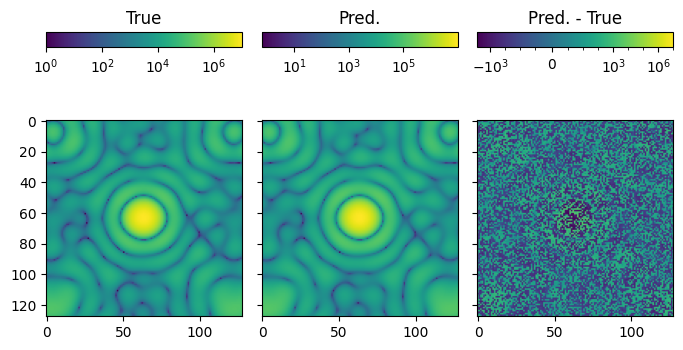

In [40]:
y_batch = y_batch.view(-1, batch_size, kuramoto.N, kuramoto.N, kuramoto.N).detach().cpu()
y_pred = y_pred.view(-1, batch_size, kuramoto.N, kuramoto.N, kuramoto.N).detach().cpu()
displacement_batch = torch.stack([torch.cos(y_batch), torch.sin(y_batch), torch.zeros_like(y_batch)], dim=-1)
displacement_pred = torch.stack([torch.cos(y_pred), torch.sin(y_pred), torch.zeros_like(y_pred)], dim=-1)
I0_pred = scattering.get_intensity(d=d, scale=1e-10, model = displacement_pred, lambda_max = lambda_max, index = 1, shape_mask = 'circle', r_out = 20)


I0_batch = scattering.get_intensity(d=d, scale=1e-10, model = displacement_batch, lambda_max = lambda_max, poisson = True, index = 1, shape_mask = 'circle', r_out = 20)


i = -1
j = 0
fig, ax = plt.subplots(2,3, figsize=(7,4), gridspec_kw={'height_ratios': [0.05,1]}, sharey='row')
fig.tight_layout()
fig.subplots_adjust(hspace=0.1, wspace=0.1)

I0_batch_diff = I0_batch - inten_perf
I0_pred_diff = I0_pred - inten_perf
sm = ax[1,0].imshow(I0_batch[1,...].cpu(),norm=colors.LogNorm())
cbar = plt.colorbar(sm, cax=ax[0,0], orientation='horizontal')
#ax[0,0].set_xticklabels([r'$-\pi$', '0', r'$\pi$'])
ax[0,0].set_title('True')

sm = ax[1,1].imshow(I0_pred[1,...].cpu(), norm=colors.LogNorm())
cbar = plt.colorbar(sm, cax=ax[0,1], orientation='horizontal')
#ax[0,1].set_xticklabels([r'$-\pi$', '0', r'$\pi$'])
ax[0,1].set_title('Pred.');

sm = ax[1,2].imshow((I0_pred[1,...].cpu())- I0_batch[1,...].cpu(), norm = matplotlib.colors.SymLogNorm(linthresh=1, vmax=lambda_max))
cbar = plt.colorbar(sm, cax=ax[0,2], orientation='horizontal')
cbar.set_ticks([-1e+3, 0, 1e+3, 1e+6])
#ax[0,1].set_xticklabels([r'$-\pi$', '0', r'$\pi$'])
ax[0,2].set_title('Pred. - True');
'''
plt.imshow(inten_perf[0,...].cpu(),norm=colors.LogNorm())
plt.xlabel("X Pixels")
plt.ylabel("Y Pixels")
plt.title("BaTiO3 (1,1,0) Diffraction Pattern")
cbar = plt.colorbar()
cbar.set_label("Intensity")
plt.show()

'''

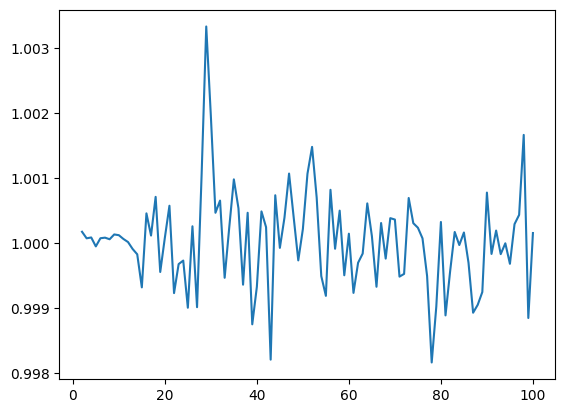

In [41]:
prtf = PRTF(I0_pred.cpu(),I0_batch.cpu(),100)
a = prtf.prtf()
b = np.linspace(1,100,100)
plt.plot(b,a[1,:]) ## So this does go above 1... thats not great

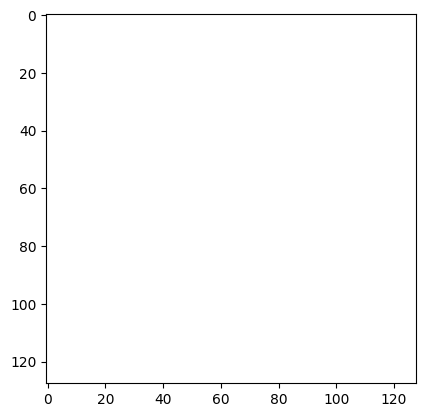

In [31]:

from matplotlib.animation import FuncAnimation
ani = prtf.animate_mask()
from IPython.display import HTML
HTML(ani.to_jshtml())

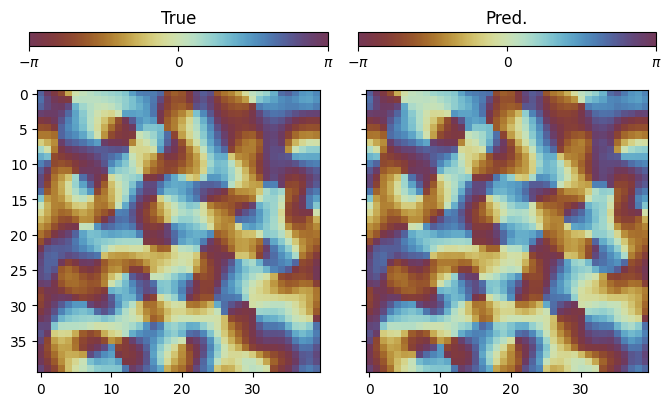

In [42]:

# Plot time step i and initial condition j
y_batch = y_batch.view(-1, batch_size, kuramoto.N, kuramoto.N, kuramoto.N).detach().cpu()
y_pred = y_pred.view(-1, batch_size, kuramoto.N, kuramoto.N, kuramoto.N).detach().cpu()

i = -1
j = 0
fig, ax = plt.subplots(2,2, figsize=(7,4), gridspec_kw={'height_ratios': [0.05,1]}, sharey='row')
fig.tight_layout()
fig.subplots_adjust(hspace=0.3, wspace=0.1)

sm = ax[1,0].imshow(y_batch[i,j,...,0] % (2 * torch.pi) - torch.pi, cmap=cm.romaO, vmin=-np.pi, vmax=np.pi)
cbar = plt.colorbar(sm, cax=ax[0,0], orientation='horizontal', ticks=[-np.pi, 0, np.pi])
ax[0,0].set_xticklabels([r'$-\pi$', '0', r'$\pi$'])
ax[0,0].set_title('True')

sm = ax[1,1].imshow(y_pred[i,j,...,0] % (2 * torch.pi) - torch.pi, cmap=cm.romaO, vmin=-np.pi, vmax=np.pi)
cbar = plt.colorbar(sm, cax=ax[0,1], orientation='horizontal', ticks=[-np.pi, 0, np.pi])
ax[0,1].set_xticklabels([r'$-\pi$', '0', r'$\pi$'])
ax[0,1].set_title('Pred.');

Text(0.5, 1.0, 'Predicted Kernel')

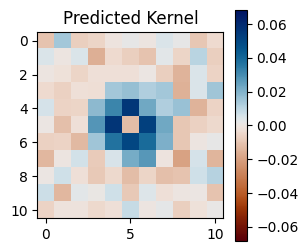

In [43]:
kernel_pred = node.conv.weight.squeeze().detach().cpu()
vmax_pred = kernel_pred.abs().max()
norm = plt.Normalize(vmin=-vmax, vmax=vmax)
fig, ax = plt.subplots(figsize=(3,3))
sm = ax.imshow(kernel_pred[..., kernel_pred.shape[-1] // 2], cmap=cm.vik_r, norm = norm)
plt.colorbar(sm, ax=ax)
plt.title("Predicted Kernel")


In [82]:
displacement_true = torch.stack([torch.cos(y_batch), torch.sin(y_batch), torch.zeros_like(y_batch)], dim=-1)
displacement_batch = torch.stack([torch.cos(y_pred), torch.sin(y_pred), torch.zeros_like(y_pred)], dim=-1)

# Scatter

In [34]:
d = (10,10,10)
scale = .05 * crystal.lattice_vectors.norm()
args = {'A': 1,
        'B': 1,
        'J': 1,
        #'K':-0.75
        'K':-0.1
       }

tf = 50
dt=0.5

#self, d, scale, model, index=None, tf=None, dt=None, args=None
Amp = scattering.get_intensity(d=d, scale=5e-10
                               , model = displacement_true, index = 1)

I0 = Amp.abs()**2

Amp2 = scattering.get_intensity(d=d, scale=5e-10
                               , model = displacement_batch, index = 1)
I02 = Amp2.abs()**2

In [37]:
I0_batch.shape

torch.Size([10, 128, 128])

In [68]:
auto_corr = scattering.autocorrelation(I0_batch,0,20)

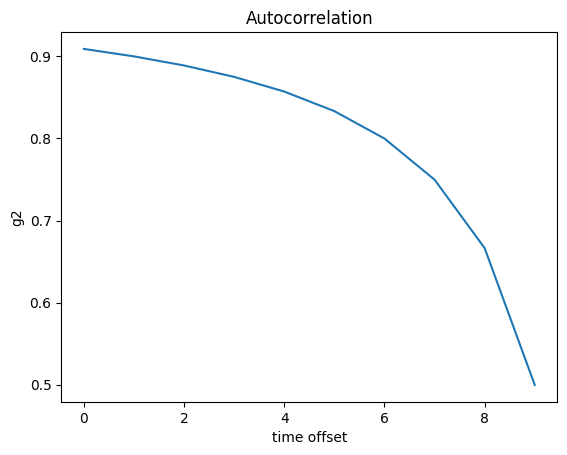

In [69]:
tau, g = auto_corr

plt.plot(tau.cpu(),g.cpu())
plt.xlabel('time offset')
plt.ylabel('g2')
plt.title('Autocorrelation')
plt.show()

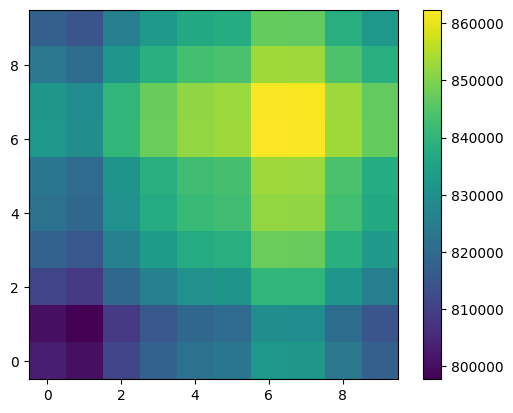

In [63]:
two_time = scattering.two_time_correlation(I0_batch,1,168) 
plt.imshow(two_time.cpu(), origin='lower')
cbar = plt.colorbar()
plt.show()
#makes sense? Most of the action happens in the first few frames

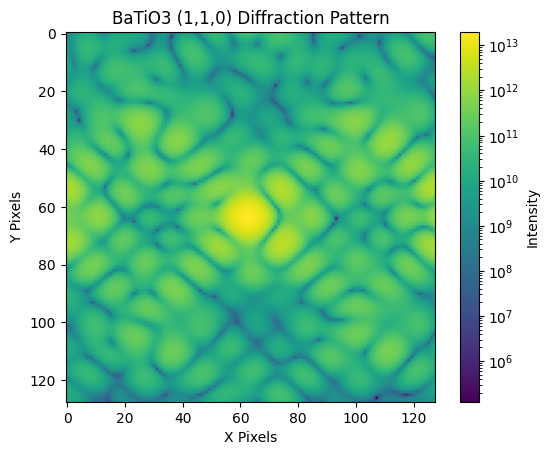

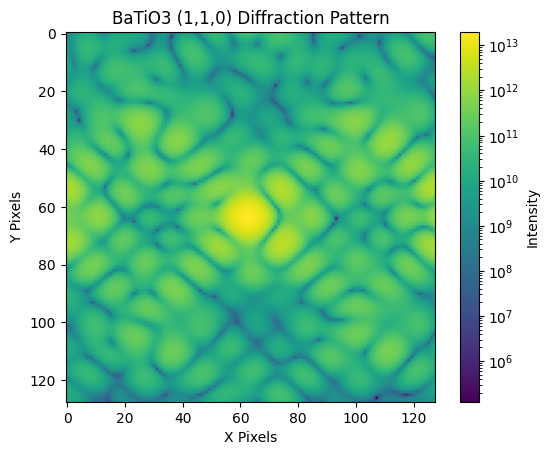

In [35]:
#vmax = 1e16,vmin = 1e10
plt.imshow(I0[0,...].cpu(),norm=colors.LogNorm())
plt.xlabel("X Pixels")
plt.ylabel("Y Pixels")
plt.title("BaTiO3 (1,1,0) Diffraction Pattern")
cbar = plt.colorbar()
cbar.set_label("Intensity")
plt.show()

plt.imshow(I02[0,...].cpu(),norm=colors.LogNorm())
plt.xlabel("X Pixels")
plt.ylabel("Y Pixels")
plt.title("BaTiO3 (1,1,0) Diffraction Pattern")
cbar = plt.colorbar()
cbar.set_label("Intensity")
plt.show()

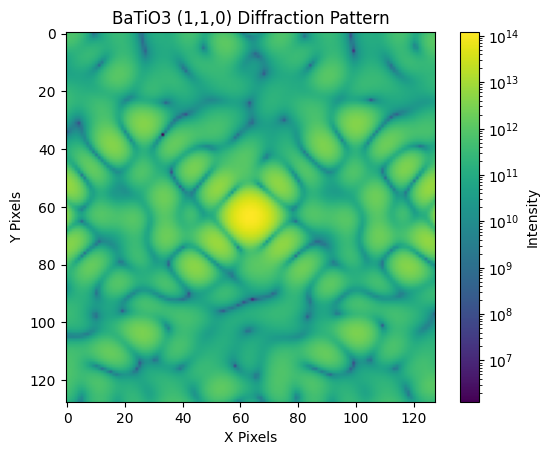

In [14]:
# This animation shows an alternating dislocation that is scaled by cos

t = np.linspace(0,1,100)
w = 2*torch.pi

fig, ax = plt.subplots()
cax = None


im = ax.imshow(I0[0,...].cpu(),norm=colors.LogNorm())
cbar = fig.colorbar(im)
cbar.set_label("Intensity")
ax.set_xlabel("X Pixels")
ax.set_ylabel("Y Pixels")
ax.set_title("BaTiO3 (1,1,0) Diffraction Pattern")
    
def update(frame):
    im.set_data(I0[frame,...].cpu())
    return [im]

ani = animation.FuncAnimation(fig, update, frames=len(t), interval=100, blit=False)
ani.save("swarm_diffraction_pattern_50.gif", writer="pillow", fps=10)
#HTML(ani.to_jshtml())

In [158]:
scattering_perf = CoherentScattering(crystal = crystal,
                                K_i = k_i,
                                K_f = k_f,
                                detector = Detector(
                                    X = 128,
                                    Y = 128,
                                    d_xy = 50e-6,
                                    R = R,
                                    #R = 0.3946,
                                    wavelength = wavelength,
                                    dtype=dtype,
                                    device=device
                                ),
                                dtype=dtype,
                                device=device)
inten_perf = scattering_perf.get_intensity(d=(5,5,5)) # n changes the pattern, higher n makes it looks zoomed out  



## XRD

/Users/b330987/miniconda3/envs/torch27/lib/python3.13/site-packages/pymatgen/analysis/diffraction/core.py:169: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.get_plot(structure, **kwargs).get_figure().show()


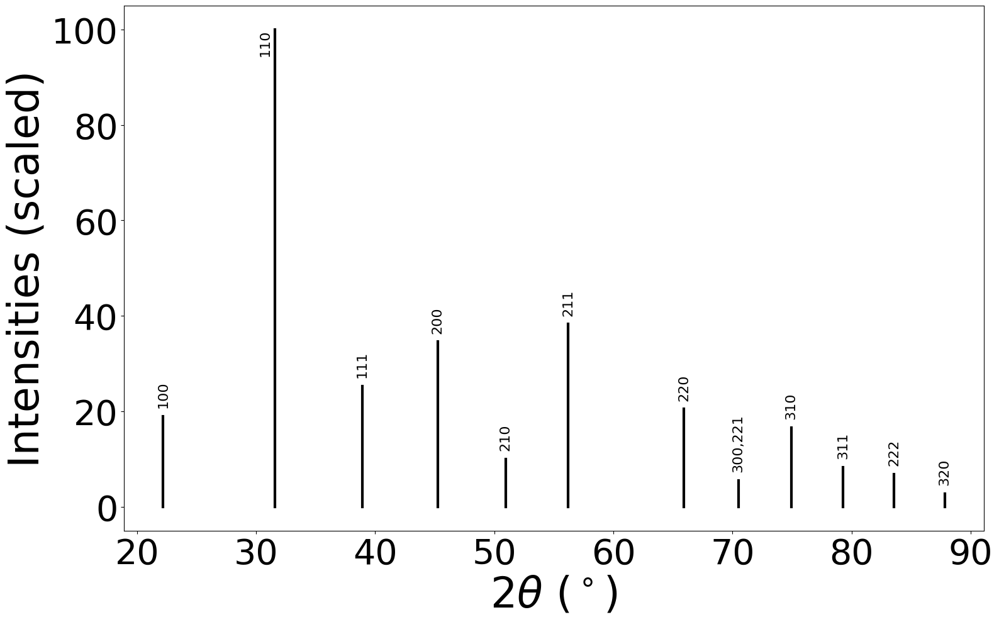

In [95]:
pattern, val = crystal.get_XRD(structure)
plt.show()

In [96]:
val

DiffractionPattern
$2\Theta$: [22.18115524 31.57126512 38.92360025 45.25286344 50.95179281 56.22252752
 65.92334706 70.49110061 74.93301873 79.28389038 83.57297284 87.82610626]
Intensity: [ 19.00223951 100.          25.22224056  34.56596701   9.96203567
  38.2594319   20.46656905   5.46194633  16.59332756   8.32831977
   6.81877802   2.74262471]

## Plotting Intensities

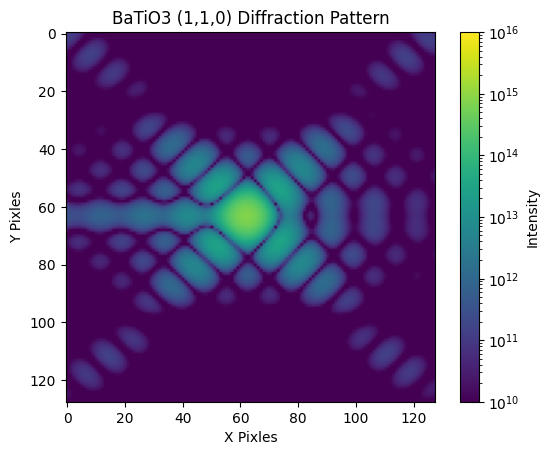

In [19]:
## Should prob experiment with adding Possion or Gaussian noise

#(could also be fun to see if neural net could work with noisier and noiser perfect diffraction data)
#vmax = Detector.round_in_base(inten.max().item(), digits = 1)
#vmin = vmax/1e5
t = torch.linspace(0,1,50)
I0 = scattering.get_intensity(d=(5,5,5), option = 'scale_displacement', t = t[-1], w = 2*torch.pi, scale = .05 * crystal.lattice_vectors.norm())
plt.imshow(I0.cpu(),norm=colors.LogNorm(vmax = 1e16,vmin = 1e10))
plt.xlabel("X Pixels")
plt.ylabel("Y Pixels")
plt.title("BaTiO3 (1,1,0) Diffraction Pattern")
cbar = plt.colorbar()
cbar.set_label("Intensity")
plt.show()

## Acts as I expect it to when disclocations are very small, but as they get larger the pattern essentially just gets more grainy, that's it
# and not significantly more grainy as it gets unreasonably large

In [14]:
from polycrystal import Polycrystal


n_grains = 200
axes = ['x', 'y', 'z']

#sizes = [(i, i, i) for i in 10 * np.random.randint(1, 6, size=n_grains)]
sizes = (50, 50, 50)
axis = np.random.randint(len(axes), size=n_grains)
angle = 2 * np.random.randn(n_grains)
crystal_misorientations = [(i, axes[j]) for (i,j) in zip(angle, axis)]


polycrystal = Polycrystal(
    'BaTiO3.cif',
    bounding_box = (1e-6, 1e-6, 1e-6),
    crystal_sizes = sizes,
    crystal_misorientations = crystal_misorientations,
    miller_indices = (1,1,0),
    target_axis = 'x',
    dtype = dtype,
    device = device
)


In [15]:
l = []
for i in sizes[0]:
    d = np.random.randint(2,6)
    while i % d != 0:
        d = np.random.randint(2,6)
    l.append(d)
d = tuple(l)
tup = tuple(l)
print(tup)

TypeError: 'int' object is not iterable

In [16]:
total_amp = 0


for grain in polycrystal.grains:
    scattering = CoherentScattering_dislocate(crystal = grain,
                                K_i = k_i,
                                K_f = k_f,
                                detector = Detector(
                                    X = 128,
                                    Y = 128,
                                    d_xy = 50e-6,
                                    R = R,
                                    #R = 0.3946,
                                    wavelength = wavelength,
                                    dtype=dtype,
                                    device=device
                                ),
                                dtype=dtype,
                                device=device)
    r_out = np.random.randint(10,65)

    #size = sizes[polycrystal.grains.index(grain)]
    #size_l = []
    '''
    for i in size:
        d = np.random.randint(2,6)
        while i % d != 0:
            d = np.random.randint(2,6)
        size_l.append(d)
    d = tuple(size_l)
    '''
    
        
    amp = scattering.get_amplitude(d=(10,10,10), scale=5e-10, model = 'Random', lambda_max = 1e+7,
                                   shape_mask='circle', r_out=r_out, start_coord=(0,0,0), end_coord=(2e-8,2e-8,2e-8))  # amplitude

    total_amp += amp

inten_total = (total_amp.abs() ** 2)


In [17]:
total_ampl = 0




for grain in polycrystal.grains:
    scattering = CoherentScattering(
        crystal=grain,
        K_i=k_i,
        K_f=k_f,
        detector=Detector(
            X=128,
            Y=128,
            d_xy=50e-6,
            R=R,
            wavelength=wavelength,
            dtype=dtype,
            device=device
        ),
        dtype=dtype,
        device=device
    )
    r_out = np.random.randint(10,65)

    
        
    ampl = scattering.get_amplitude(d=(10,10,10), shape_mask='circle', r_out=r_out, start_coord=(0,0,0), end_coord=(2e-8,2e-8,2e-8))  # amplitude

    total_ampl += ampl

inten_total_perf = (total_ampl.abs() ** 2)

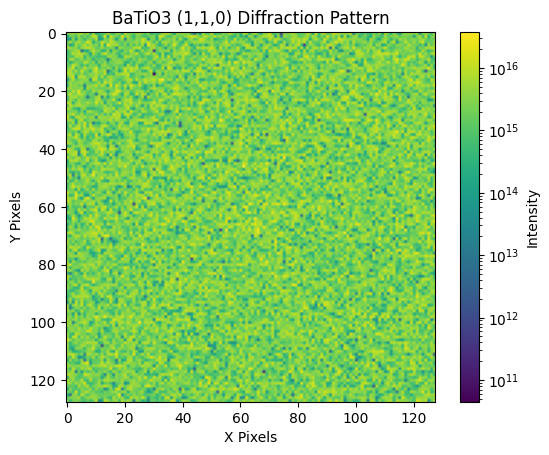

In [18]:
plt.imshow(inten_total_perf[:,:].cpu(),norm=colors.LogNorm())
plt.xlabel("X Pixels")
plt.ylabel("Y Pixels")
plt.title("BaTiO3 (1,1,0) Diffraction Pattern")
cbar = plt.colorbar()
cbar.set_label("Intensity")
plt.show()

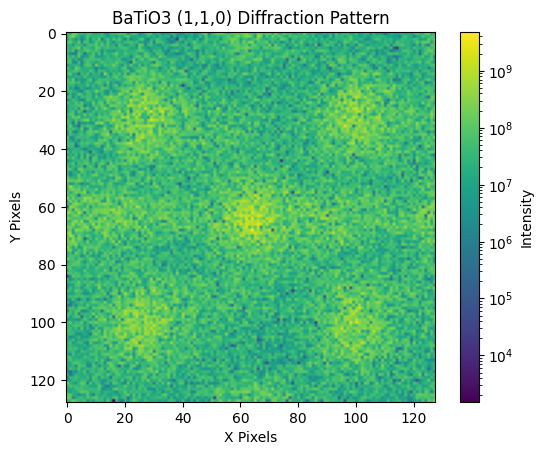

In [101]:
plt.imshow(inten_total[0,:,:].cpu(),norm=colors.LogNorm())
plt.xlabel("X Pixels")
plt.ylabel("Y Pixels")
plt.title("BaTiO3 (1,1,0) Diffraction Pattern")
cbar = plt.colorbar()
cbar.set_label("Intensity")
plt.show()

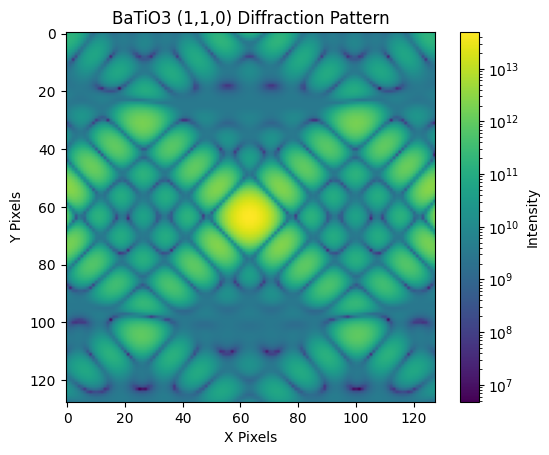

In [66]:

scattering_perf_rad = CoherentScattering(crystal = crystal,
                                K_i = k_i,
                                K_f = k_f,
                                detector = Detector(
                                    X = 128,
                                    Y = 128,
                                    d_xy = 50e-6,
                                    R = R,
                                    #R = 0.3946,
                                    wavelength = wavelength,
                                    dtype=dtype,
                                    device=device
                                ),
                                dtype=dtype,
                                device=device)
inten_perf = scattering_perf_rad.get_intensity(d=(10,10,10), shape_mask = 'circle', r_out = 60,)
inten_perf = inten_perf[:,:]
plt.imshow(inten_perf.cpu(),norm=colors.LogNorm())
plt.xlabel("X Pixels")
plt.ylabel("Y Pixels")
plt.title("BaTiO3 (1,1,0) Diffraction Pattern")
cbar = plt.colorbar()
cbar.set_label("Intensity")
plt.show()

## Noise

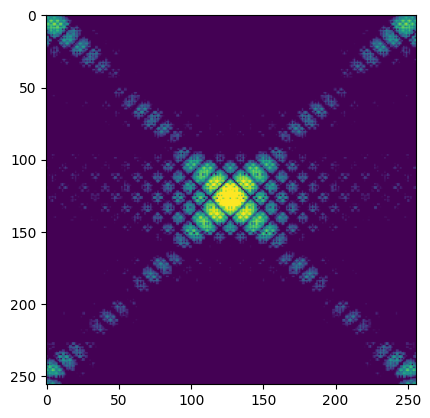

In [95]:
gaussian_noise = np.random.normal(1e-4, 1e-4, inten.shape)
plt.imshow(inten.cpu()+torch.from_numpy(gaussian_noise), norm=colors.LogNorm(vmin = 1e+11, vmax = 1e+15))

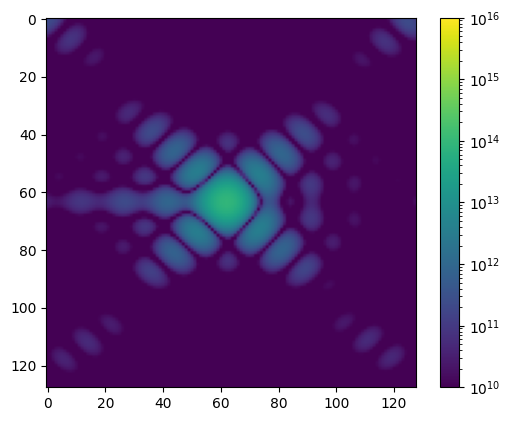

In [108]:
poisson_noise = torch.poisson(inten.cpu())
noisy_pattern = inten.cpu() + poisson_noise
plt.imshow(noisy_pattern, norm=colors.LogNorm(vmax = 1e16,vmin = 1e10)) ## trying to change plotting
plt.colorbar()
plt.show()

# Max Intensity Test

In [13]:
I_max = scattering.max_intensity(rotated_structure = rotated_structure) ## I have no clue how to plot this

In [14]:
I_max.shape

torch.Size([256, 256])

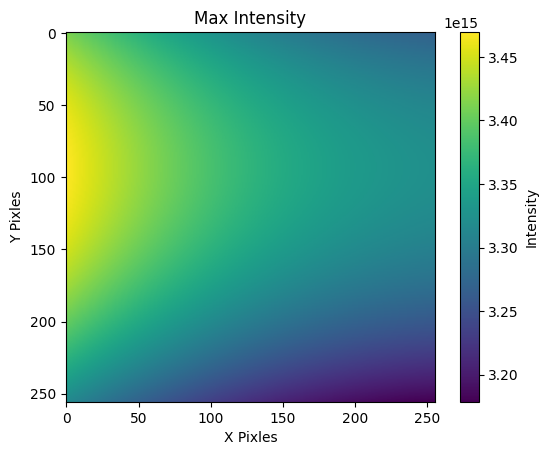

In [15]:
plt.imshow(I_max.cpu()) ## trying to change plotting
plt.xlabel("X Pixels")
plt.ylabel("Y Pixels")
plt.title("Max Intensity")
cbar = plt.colorbar()
cbar.set_label("Intensity")
plt.show()

# $$Na(BH)_5$$

In [54]:
crystal_NaBH = Crystal(
    'Na(BH)5.cif',
    crystal_size = (100, 100, 100),
    dtype = dtype,
    device = device
)
 
structure_NaBH = crystal_NaBH.parse_cif_file()
rotated_structure_NaBH = crystal_NaBH.align_miller_plane_to_axis(structure_NaBH, (0,2,1), target_axis='x')
crystal_NaBH.calculate_crystal_properties(rotated_structure_NaBH)
crystal_NaBH.get_atomic_form_factors()
lengths_Na = crystal_NaBH.lattice_vectors.norm(dim=1)
print('Sample size:', ' nm x '.join('{:.1f}'.format(crystal_NaBH.crystal_size[i] * lengths_Na[i] * 1e9) for i in range(len(lengths_Na))), 'nm')

Sample size: 67.4 nm x 133.4 nm x 122.7 nm


In [55]:
wavelength = 1.5406e-10 #m

R_Na = get_R(crystal = crystal_NaBH, beta = 5, rotated_structure = rotated_structure_NaBH, wavelength = wavelength, d_xy = 50e-6)
print(R_Na)

0.21885749058808246


In [56]:
theta_B = torch.deg2rad(torch.torch.tensor(7.834377355, dtype=dtype, device = device)) 
k_i = torch.tensor([torch.sin(-theta_B), 0.0, torch.cos(-theta_B)], dtype=dtype, device=device)
k_f = torch.tensor([torch.sin(theta_B), 0., torch.cos(theta_B)], dtype=dtype, device=device)
scattering_NaBH = CoherentScattering(crystal = crystal_NaBH,
                                K_i = k_i,
                                K_f = k_f,
                                detector = Detector(
                                    X = 256,
                                    Y = 256,
                                    d_xy = 50e-6,
                                    R = R_Na,
                                    #R = 0.3946,
                                    wavelength = wavelength,
                                    dtype=dtype,
                                    device=device
                                ),
                                dtype=dtype,
                                device=device)
t0 = time.time()
inten_Na = scattering_NaBH.get_intensity(d=(6,6,6)) # n changes the pattern, higher n makes it looks zoomed out  
print(time.time() - t0)


0.9419939517974854


/Users/b330987/miniconda3/envs/torch27/lib/python3.13/site-packages/pymatgen/analysis/diffraction/core.py:169: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.get_plot(structure, **kwargs).get_figure().show()


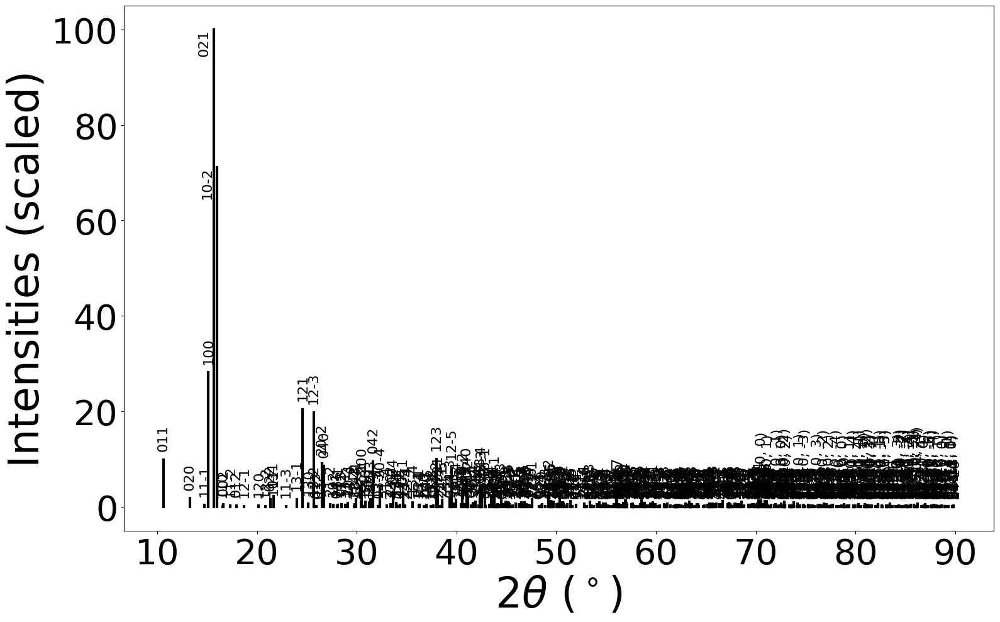

In [41]:
pattern, val = crystal_NaBH.get_XRD(structure_Na)
plt.show()

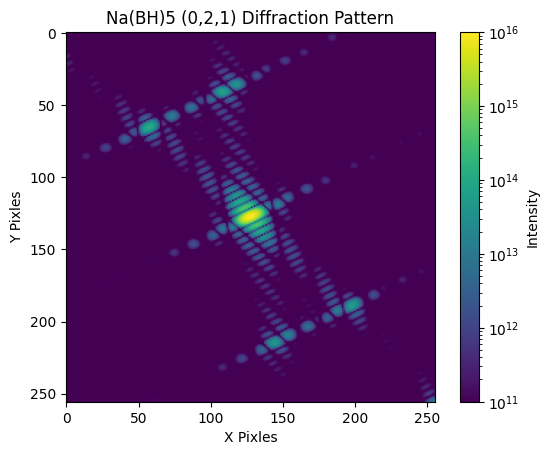

In [57]:
plt.imshow(inten_Na.cpu(),norm=colors.LogNorm(vmin = 1e+11, vmax = 1e+16)) #not sure for the norm
plt.xlabel("X Pixels")
plt.ylabel("Y Pixels")
plt.title("Na(BH)5 (0,2,1) Diffraction Pattern")
cbar = plt.colorbar()
cbar.set_label("Intensity")
plt.show()

In [97]:
crystal.atom_positions[:,2].shape

torch.Size([88])

# Timing Plots

Calculating error wrt the smallest possible unit cell and overlay it wrt time
Using equation 15 of the paper -- > I0 is the smallest unit cell size (start with 50)

import gc
del ...
torch.cuda.empty_cache()
gc.collect()

In [12]:
def chi_sqr_err(I0,Id):
    sqr_diff = (torch.sqrt(Id)-torch.sqrt(I0))**2
    return torch.sum(sqr_diff) / torch.sum(I0)
  

## 50

In [37]:
inten_perf_0 = scattering_perf.get_intensity(d=(2,2,2))
t0 = time.time()
for i in range(100):
    inten = scattering_perf.get_intensity(d=(2,2,2)) # n changes the pattern, higher n makes it looks zoomed out  
print((time.time() - t0)/100)


0.035199427604675294


In [88]:
inten_perf_500_2 = scattering_perf.get_intensity(d=(10,10,5))
t0 = time.time()
for i in range(100):
    inten = scattering_perf.get_intensity(d=(10,10,2)) # n changes the pattern, higher n makes it looks zoomed out  
print((time.time() - t0)/100)


0.0029931211471557616


In [89]:
Supercell_volume_list_50 = np.array([8, 20, 50, 125, 40, 200, 100, 250, 500, 1000])
err_20_2 = chi_sqr_err(inten_perf_0,inten_perf_20_2)
err_50_2 = chi_sqr_err(inten_perf_0,inten_perf_50_2)
err_125 = chi_sqr_err(inten_perf_0,inten_perf_125)
err_40_2 = chi_sqr_err(inten_perf_0,inten_perf_40_2)
err_200_2 = chi_sqr_err(inten_perf_0,inten_perf_200_2)
err_100_2 = chi_sqr_err(inten_perf_0,inten_perf_100_2)
err_250_2 = chi_sqr_err(inten_perf_0,inten_perf_250_2)
err_500_2 = chi_sqr_err(inten_perf_0,inten_perf_500_2)
err_1000 = chi_sqr_err(inten_perf_0,inten_perf_1000)

In [97]:
#err_perf_list = [0, err_20.cpu(), err_50.cpu(), err_125.cpu(), err_40.cpu(), err_200.cpu(), err_100.cpu(), err_250.cpu(), err_500.cpu(), err_1000.cpu()]
err_perf_list_2 = [0, err_20_2.cpu(), err_50_2.cpu(), err_125.cpu(), err_40_2.cpu(), err_200_2.cpu(), err_100_2.cpu(), err_250_2.cpu(), err_500_2.cpu(), err_1000.cpu()]
print(err_perf_list_2)
print(err_perf_list)

[0, tensor(0.0009), tensor(0.0019), tensor(0.0021), tensor(0.0561), tensor(0.2075), tensor(0.0620), tensor(0.0634), tensor(0.2107), tensor(0.2236)]
[0, tensor(8.7049e-07), tensor(0.0010), tensor(0.0021), tensor(1.9817e-05), tensor(0.0632), tensor(0.0013), tensor(0.0028), tensor(0.0697), tensor(0.2236)]


In [124]:
time_perf_list = [0.0351994276, 0.01431217909, 0.006630198956, 0.003051257133, 0.007970559597, 0.002872152328, 0.004013369083, 0.002081637383, 0.001953589916, 0.001931278706]
x_fit_50 = np.linspace(min(Supercell_volume_list_50), 250, 500)
x_fit_err =  np.linspace(min(Supercell_volume_list_50), max(Supercell_volume_list_50), 500)

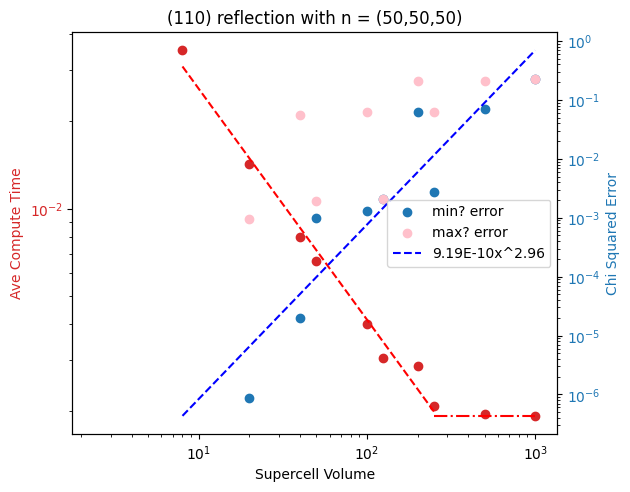

In [138]:
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xscale("log")
ax1.set_yscale("log")
ax1.set_xlabel('Supercell Volume')
ax1.set_ylabel('Ave Compute Time', color=color)
ax1.scatter(Supercell_volume_list_50, time_perf_list, color=color)
ax1.plot(x_fit_50,0.162*x_fit_50**-0.796, 'r--', label = '0.162x^-0.796')
ax1.tick_params(axis='y', labelcolor=color)
ax1.hlines(y=0.00193, xmin=250, xmax = 1000, color = 'red', ls = "-.")
#ax1.axhline(y=0.00193, xmin = 250, xmax = 1000, label = 'y=0.00193', color = 'red')
#ax1.axvline(x=40, label = '(110) reflection d = (2,2,10)', color = 'green')
#ax1.axvline(x=250, label = '(110) reflection d = (5,5,10)', color = 'purple')


ax2 = ax1.twinx()  # instantiate a second Axes that shares the same x-axis
ax2.set_xscale("log")
ax2.set_yscale("log")
color = 'tab:blue'
ax2.set_ylabel('Chi Squared Error', color=color)  # we already handled the x-label with ax1
ax2.scatter(Supercell_volume_list_50, err_perf_list, color=color, label = 'min? error')
ax2.scatter(Supercell_volume_list_50, err_perf_list_2, color='pink',label = 'max? error')
ax2.plot(x_fit_err,9.19E-10*x_fit_err**2.96, 'b--', label = '9.19E-10x^2.96')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc = 'center right')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('(110) reflection with n = (50,50,50)')
plt.show()

## 60

In [160]:
'''
inten_60perf_10 = scattering_perf.get_intensity(d=(10,10,10))
t0 = time.time()
for i in range(100):
    inten = scattering_perf.get_intensity(d=(10,10,10)) # n changes the pattern, higher n makes it looks zoomed out  
t10 = (time.time() - t0)/100
print((time.time() - t0)/100)
er10 = chi_sqr_err(inten_60perf_0,inten_60perf_10)
'''

0.002805328369140625


In [7]:
Supercell_volume_list_60_perf = np.array([2**3, 3**3, 4**3, 5**3 ,6**3, 10**3, 12**3, 15**3, 20**3, 30**3])
t_list = [0.08161668777, 0.02741724968, 0.008424868584, 0.004960010052, 0.003178958893, 0.002805328369, 0.002121510506, 0.001984069347, 0.001954548359, 0.001470067501]
err_l = [1e-10, 1.9975e-05, 0.0001, 0.0006, 0.0023, 0.1272, 0.2141, 2.4752, 4.1685, 17.6388]


x_fit = np.linspace(min(Supercell_volume_list_60_perf), max(Supercell_volume_list_60_perf), 300)

Supercell_volume_list_60_dis = np.array([3**3, 4**3, 5**3 ,6**3, 10**3, 12**3, 15**3, 20**3, 30**3])
time_list_60 = np.array([0.133293199539184, 0.0568516969680786, 0.0330431938171386, 0.0278009176254272, 0.00902431011199951, 0.00835411548614501, 0.00820999145507812, 0.00809931755065918, 0.00794649124145507])

In [8]:
def power_law(V, a, b):
    return a * V**b

popt, pcov = curve_fit(power_law, Supercell_volume_list_60_perf, t_list)
a_fit, b_fit = popt
print(a_fit,b_fit)


popter, pcover = curve_fit(power_law, Supercell_volume_list_60_perf, err_l)
a_er, b_er = popter
print(a_er, b_er)

popt_dis, pcov_dis = curve_fit(power_law, Supercell_volume_list_60_dis, time_list_60)
a_dis, b_dis = popt_dis


def power_law_offset(V, a, b, c):
    return a * V**(-b) + c



0.6043252660822276 -0.9614630505906836
0.00015584793402168026 1.1403868706809095


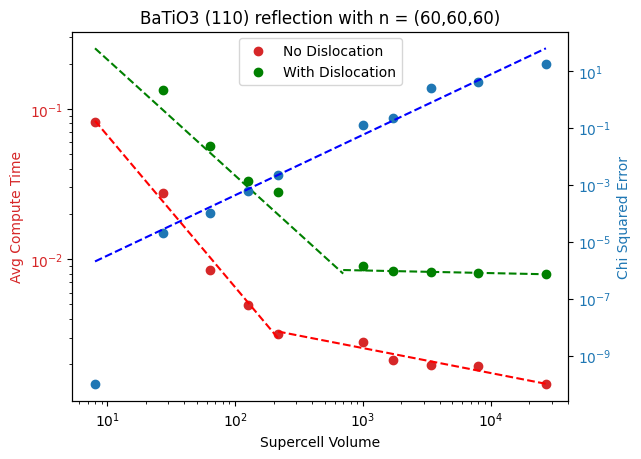

In [9]:
#popt, pcov = curve_fit(power_law, Supercell_volume_list_60_perf, t_list)
#a_fit, b_fit, c_fit = popt

#popt1, pcov1 = curve_fit(power_law, Supercell_volume_list_60_dis, time_list_60)
#a_fit1, b_fit1, c_fit1 = popt1
x_fit_1 = np.linspace(min(Supercell_volume_list_60_perf), 216, 300)
x_fit_2 = np.linspace(216, max(Supercell_volume_list_60_perf), 300)

x_fit_1_1 = np.linspace(min(Supercell_volume_list_60_perf), 700, 300)
x_fit_2_1 = np.linspace(700, max(Supercell_volume_list_60_perf), 300)

fig2, ax3 = plt.subplots()

color = 'tab:red'

ax3.set_xscale("log")
ax3.set_yscale("log")
ax3.set_xlabel('Supercell Volume')
ax3.set_ylabel('Avg Compute Time', color=color)
ax3.scatter(Supercell_volume_list_60_perf, t_list, color=color, label = 'No Dislocation')
#ax3.plot(x_fit,power_law(x_fit, a_fit, b_fit), 'r--', label = '')
ax3.plot(x_fit_1,0.681*x_fit_1**-1.01, 'r--', label = '') #0.681x^-1.01
ax3.plot(x_fit_2,8.06E-03*x_fit_2**-0.166, 'r--', label = '') #8.06E-03x^-0.166
ax3.tick_params(axis='y', labelcolor=color)
#ax3.hlines(y=0.00193, xmin=250, xmax = 1000, color = 'red', ls = "-.")
ax3.scatter(Supercell_volume_list_60_dis, time_list_60, color = 'green', label = 'With Dislocation') 
ax3.plot(x_fit_1_1,1.26*x_fit_1_1**-0.772, 'g--', label = '') #1.26x^-0.722
ax3.plot(x_fit_2_1,9.51E-03*x_fit_2_1**-0.0177, 'g--', label = '') #9.51E-03x^-0.0177



ax4 = ax3.twinx()  # instantiate a second Axes that shares the same x-axis
ax4.set_xscale("log")
ax4.set_yscale("log")
color = 'tab:blue'
ax4.set_ylabel('Chi Squared Error', color=color)  
ax4.scatter(Supercell_volume_list_60_perf, err_l, color=color)
#ax4.plot(x_fit,a_er*x_fit**(b_er), 'b--', label = '') #2.5E-08x^2.12
ax4.plot(x_fit,2.5e-08*x_fit**2.12, 'b--', label = "2.5e-08*x_fit**2.12") #I guessed the fitting funtion -- I'm very proud of that
ax4.tick_params(axis='y', labelcolor=color)
ax3.legend(loc = 'upper center')

#fig2.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('BaTiO3 (110) reflection with n = (60,60,60)')
plt.savefig("Timing_plot.jpg", dpi = 300) 
plt.show()

In [12]:
# Run it for 80x80x80... overlay compute size 
# Either alternaring displacement, or seeded randim dsplacement (torch.manual_seed(3))

## 80

In [71]:
'''
scale = .05 * crystal.lattice_vectors.norm()
inten_80_512000 = scattering.get_intensity(d=(10,10,10), scale = scale)
t0 = time.time()
for i in range(100):
    inten = scattering.get_intensity(d=(10,10,10), scale = scale) # n changes the pattern, higher n makes it looks zoomed out  
t10 = (time.time() - t0)/100
print((time.time() - t0)/100)
er512000 = chi_sqr_err(inten_80_64,inten_80_512000)
print(er512000)
'''

0.04892925977706909
tensor(0.1134, device='mps:0')


In [29]:
sup_size = [8,64,125,512,1000,4096,8000,64000, 80**3]
t_80 = [0.141294150352478, 0.0184526896476745, 0.00988025188446044, 0.00355675220489501, 0.0029240703582763673, 
        0.0020760393142700197, 0.001906599998474121, 0.0011515069007873536, 0.0010916590690612793]
er_80 = [1e-10, 3.61e-5, 0.0001, 0.0025, 0.1160, 0.2053, 2.5194, 17.7429, 167.9222]
sup_err = [64,125,512,1000,4096,8000,64000, 80**3]
t_disloc = [0.1784894895553589, 0.11032127857208252, 0.05160271883010864, 0.04411409139633179, 0.0353781008720398, 0.035097191333770754,
           0.03446579933166504, 0.03274874210357666]
er_disloc = [1e-10, 4.8404e-05, 0.0023, 0.1134, 0.2186, 2.4922, 18.5461,188.0996]


In [30]:
popt_80_er, pcov_80_er= curve_fit(power_law, sup_size, er_80)
a_80_er, b_80_er = popt_80_er



popt_80_t, pcov_80_t = curve_fit(power_law,sup_size,t_80, p0 = [0.0808, -0.452])
a_80_t, b_80_t = popter
print(popter)




[1.55847934e-04 1.14038687e+00]


In [31]:
popt2, pcov2 = curve_fit(power_law, sup_size, t_80)
a_fit2, b_fit2= popt2



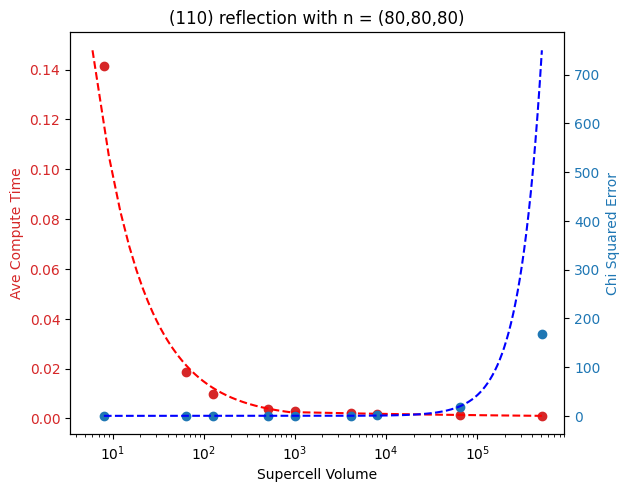

In [73]:
fig, ax1 = plt.subplots()

x_fit_80_1 = np.linspace(6, 920, 300)
x_fit_80_2 = np.linspace(920, max(sup_size), 300)

color = 'tab:red'

ax1.set_xscale("log")
#ax1.set_yscale("log")
ax1.set_xlabel('Supercell Volume')
ax1.set_ylabel('Ave Compute Time', color=color)
ax1.scatter(sup_size, t_80, color=color, label = 'Time No Dislocation')
#ax1.scatter(sup_err, t_disloc, color = 'orange', label = 'Time Dislocation')
ax1.plot(x_fit_80_1,0.641*x_fit_80_1**-0.819, 'r--', label = '')  #0.641x^-0.819
ax1.plot(x_fit_80_2,6.67E-03*x_fit_80_2**-0.144, 'r--', label = '')  #6.67E-03x^-0.144
ax1.tick_params(axis='y', labelcolor=color)
#ax3.hlines(y=0.00193, xmin=250, xmax = 1000, color = 'red', ls = "-.")
#ax1.scatter(Supercell_volume_list_60_perf, time_list_60, color = 'green', label = 'With Dislocation')



ax2 = ax1.twinx()  # instantiate a second Axes that shares the same x-axis
ax2.set_xscale("log")
#ax2.set_yscale("log")
color = 'tab:blue'
ax2.set_ylabel('Chi Squared Error', color=color)  
ax2.scatter(sup_size, er_80, color=color, label = 'Error No Dislocation')
#ax2.scatter(sup_err, er_disloc, color = 'purple', label = 'Error Dislocation')
#ax2.plot(x_fit_80,a_80_er*x_fit_80**(b_80_er), 'b--', label = '')
ax2.plot(x_fit_80,6.71e-08*x_fit_80**(1.76), 'b--', label = '') #6.71E-08x^1.76
ax2.tick_params(axis='y', labelcolor=color)
#ax1.legend(loc = 'center right')
#ax2.legend(loc = 'center right')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('(110) reflection with n = (80,80,80)')
plt.show()

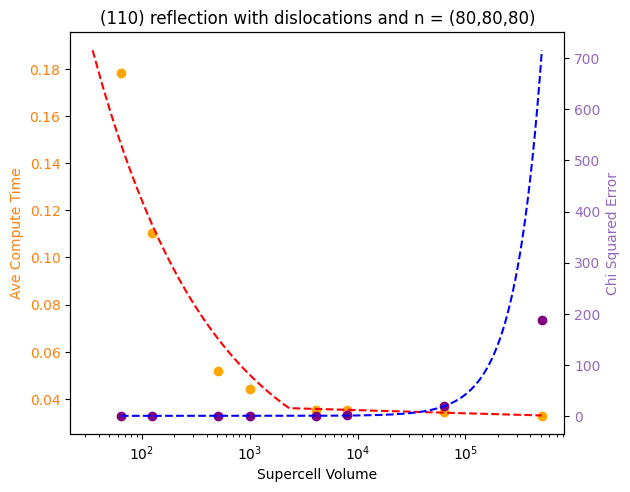

In [86]:
x_fit_80_1 = np.linspace(35, 2400, 300)
x_fit_80_2 = np.linspace(2500, max(sup_err), 300)
x_fit_80_11 = np.linspace(min(sup_err), max(sup_err), 300)

fig, ax1 = plt.subplots()

color = 'tab:orange'

ax1.set_xscale("log")
#ax1.set_yscale("log")
ax1.set_xlabel('Supercell Volume')
ax1.set_ylabel('Ave Compute Time', color=color)
ax1.scatter(sup_err, t_disloc, color = 'orange', label = 'Time Dislocation')
ax1.plot(x_fit_80_1,0.763*x_fit_80_1**-0.394, 'r--', label = '') #0.763x^-0.394
ax1.plot(x_fit_80_2,0.041*x_fit_80_2**-0.0167, 'r--', label = '') #0.041x^-0.0167
ax1.tick_params(axis='y', labelcolor=color)


#pop, cov= curve_fit(power_law_offset, sup_err, er_disloc)

ax2 = ax1.twinx()  # instantiate a second Axes that shares the same x-axis
ax2.set_xscale("log")
#ax2.set_yscale("log")
color = 'tab:purple'
ax2.set_ylabel('Chi Squared Error', color=color)  
ax2.scatter(sup_err, er_disloc, color = 'purple', label = 'Error Dislocation')
ax2.plot(x_fit_80_11,8.33E-08*x_fit_80_11**1.74, 'b--', label = "2.5e-08*x_fit**2.12") #8.33E-08x^1.74

ax2.tick_params(axis='y', labelcolor=color)


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('(110) reflection with dislocations and n = (80,80,80)')
plt.show()

In [33]:


n1,n2,n3 = (10,10,10)
d1,d2,d3 = (2,2,2)

i_indices = torch.arange(0, n1, d1, dtype=dtype, device=device)
j_indices = torch.arange(0, n2, d2, dtype=dtype, device=device)
k_indices = torch.arange(0, n3, d3, dtype=dtype, device=device)

            # Compute a grid of all indices

i, j, k = torch.meshgrid(i_indices, j_indices, k_indices, indexing='xy')
 
            # Reshape to [n_supercells, 3]

supercell_indices = torch.stack([i.flatten(), j.flatten(), k.flatten()], dim=1)

            # Calculate positions in real space --> this is R_nd

        #This is our R_nd comp
print(supercell_indices.shape)

#supercell_positions = torch.matmul(supercell_indices, self.crystal.lattice_vectors) ## full grid of R_nd

center_i = (n1 - 1) / 2
center_j = (n2 - 1) / 2
center_k = (n3 - 1) / 2

            # Downsampled center
center_i /= d1
center_j /= d2
center_k /= d3


            # Compute distance from center for each grid point
dist_from_center = torch.sqrt((i - center_i) ** 2 + (j - center_j) ** 2 + (k - center_k) ** 2)

            

mask = (dist_from_center < 10).to(dtype=dtype)  # [n1, n2, n3]
mask = mask.flatten()  # [n1, n2, n3, 1]
print(mask.shape)

        
#supercell_positions = supercell_positions * mask  # [n1, n2, n3, 3]
            

torch.Size([125, 3])
torch.Size([125])


In [127]:
d1, d2, d3 = (5,5,5)
n1, n2, n3 = (50, 50, 50)

i_indices = torch.arange(0, n1, d1, dtype=dtype, device=device)
j_indices = torch.arange(0, n2, d2, dtype=dtype, device=device)
k_indices = torch.arange(0, n3, d3, dtype=dtype, device=device)

            # Compute a grid of all indices

i, j, k = torch.meshgrid(i_indices, j_indices, k_indices, indexing='xy')
 
            # Reshape to [n_supercells, 3]

supercell_indices = torch.stack([i.flatten(), j.flatten(), k.flatten()], dim=1)

            # Calculate positions in real space --> this is R_nd

supercell_positions = torch.matmul(supercell_indices, crystal.lattice_vectors) ## full grid of R_nd

print(supercell_indices)
'''
x0, y0, z0 = start_coord
x1, y1, z1 = end_coord

mask_bool = (
    (supercell_positions[:, 0] >= x0) & (supercell_positions[:, 0] < x1) &
    (supercell_positions[:, 1] >= y0) & (supercell_positions[:, 1] < y1) &
    (supercell_positions[:, 2] >= z0) & (supercell_positions[:, 2] < z1)
)
'''

tensor([[ 0.,  0.,  0.],
        [ 0.,  0.,  5.],
        [ 0.,  0., 10.],
        ...,
        [45., 45., 35.],
        [45., 45., 40.],
        [45., 45., 45.]], device='cuda:3')


'\nx0, y0, z0 = start_coord\nx1, y1, z1 = end_coord\n\nmask_bool = (\n    (supercell_positions[:, 0] >= x0) & (supercell_positions[:, 0] < x1) &\n    (supercell_positions[:, 1] >= y0) & (supercell_positions[:, 1] < y1) &\n    (supercell_positions[:, 2] >= z0) & (supercell_positions[:, 2] < z1)\n)\n'

In [134]:
supercell_indices.shape

torch.Size([1000, 3])